In [ ]:
# ==========================================
# 1. SETUP AND INSTALLATION
# ==========================================

# Install necessary libraries (if not already installed)
!pip install numpy pandas matplotlib seaborn scipy openpyxl -q

# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.optimize import fsolve
import warnings
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
np.random.seed(42)

# Set plot style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("✅ All libraries imported successfully!")
print(f"NumPy version: {np.__version__}")
print(f"Pandas version: {pd.__version__}")

✅ All libraries imported successfully!
NumPy version: 2.0.2
Pandas version: 2.2.2


In [ ]:
# ==========================================
# 2. DATA COLLECTION AND RISK IDENTIFICATION
# ==========================================

# 2.1 Define Cost Components based on Adana City Hospital Project Data
# Sources: Rönesans Holding (2023), EBRD (2014), World Bank (2019)

cost_components = {
    'Electrical Infrastructure': {
        'mode': 85_000_000,      # Most likely cost (USD)
        'min': 70_000_000,       # Minimum cost
        'max': 110_000_000,      # Maximum cost
        'risk_level': 'High'
    },
    'PSA Oxygen Plant': {
        'mode': 75_000_000,
        'min': 60_000_000,
        'max': 95_000_000,
        'risk_level': 'Medium'
    },
    'Surgical Bed Expansion': {
        'mode': 65_000_000,
        'min': 50_000_000,
        'max': 85_000_000,
        'risk_level': 'Low'
    },
    'Operational Costs': {
        'mode': 300_000_000,
        'min': 280_000_000,
        'max': 340_000_000,
        'risk_level': 'Medium'
    }
}

# Convert to DataFrame for easier handling
df_costs = pd.DataFrame.from_dict(cost_components, orient='index')
df_costs['mean'] = (df_costs['min'] + df_costs['mode'] + df_costs['max']) / 3
print("📊 Cost Components Summary:")
print(df_costs[['mode', 'mean', 'min', 'max', 'risk_level']])
print("\n" + "="*60 + "\n")

📊 Cost Components Summary:
                                mode          mean        min        max  \
Electrical Infrastructure   85000000  8.833333e+07   70000000  110000000   
PSA Oxygen Plant            75000000  7.666667e+07   60000000   95000000   
Surgical Bed Expansion      65000000  6.666667e+07   50000000   85000000   
Operational Costs          300000000  3.066667e+08  280000000  340000000   

                          risk_level  
Electrical Infrastructure       High  
PSA Oxygen Plant              Medium  
Surgical Bed Expansion           Low  
Operational Costs             Medium  




In [ ]:
# ==========================================
# 3. LOGNORMAL PARAMETER ESTIMATION
# Following Chang & Ko (2017) Methodology
# ==========================================

def estimate_lognormal_parameters(mode, mean):
    """
    Estimate lognormal parameters (mu and sigma) from mode and mean.

    Equations:
    mode = exp(mu - sigma^2)
    mean = exp(mu + sigma^2/2)

    Parameters:
    -----------
    mode : float
        Most likely value (expert estimate)
    mean : float
        Expected value (mean of distribution)

    Returns:
    --------
    mu : float
        Mean of log-transformed variable
    sigma : float
        Standard deviation of log-transformed variable
    """
    try:
        # Solve for sigma^2 using ratio of mean to mode
        ratio = mean / mode
        sigma_sq = np.log(ratio)  # Since mean/mode = exp(3*sigma^2/2)? Wait, let's re-derive
        # Correction: From the equations:
        # mean/mode = exp(mu + sigma^2/2) / exp(mu - sigma^2) = exp(3*sigma^2/2)
        # So sigma^2 = (2/3) * ln(mean/mode)
        sigma_sq = (2/3) * np.log(ratio)
        sigma = np.sqrt(sigma_sq)

        # Calculate mu
        mu = np.log(mode) + sigma_sq

        return mu, sigma
    except:
        # Fallback method using moments
        variance = ((mean - mode) ** 2) / 4
        sigma = np.sqrt(np.log(1 + variance / (mean ** 2)))
        mu = np.log(mean) - (sigma ** 2) / 2
        return mu, sigma

# Apply to each cost component
params = {}
for component in df_costs.index:
    mode = df_costs.loc[component, 'mode']
    mean = df_costs.loc[component, 'mean']
    mu, sigma = estimate_lognormal_parameters(mode, mean)
    params[component] = {'mu': mu, 'sigma': sigma}
    print(f"📈 {component}:")
    print(f"   μ (log-mean) = {mu:.4f}")
    print(f"   σ (log-std)  = {sigma:.4f}")
    print(f"   Variance     = {sigma**2:.6f}\n")

# Add parameters to DataFrame
df_costs['mu'] = [params[comp]['mu'] for comp in df_costs.index]
df_costs['sigma'] = [params[comp]['sigma'] for comp in df_costs.index]
df_costs['variance'] = df_costs['sigma'] ** 2

print("\n📊 Lognormal Parameters Summary:")
print(df_costs[['mode', 'mean', 'mu', 'sigma', 'variance']])
print("="*60 + "\n")

📈 Electrical Infrastructure:
   μ (log-mean) = 18.2838
   σ (log-std)  = 0.1601
   Variance     = 0.025644

📈 PSA Oxygen Plant:
   μ (log-mean) = 18.1477
   σ (log-std)  = 0.1210
   Variance     = 0.014653

📈 Surgical Bed Expansion:
   μ (log-mean) = 18.0068
   σ (log-std)  = 0.1299
   Variance     = 0.016879

📈 Operational Costs:
   μ (log-mean) = 19.5339
   σ (log-std)  = 0.1210
   Variance     = 0.014653


📊 Lognormal Parameters Summary:
                                mode          mean         mu     sigma  \
Electrical Infrastructure   85000000  8.833333e+07  18.283806  0.160138   
PSA Oxygen Plant            75000000  7.666667e+07  18.147651  0.121048   
Surgical Bed Expansion      65000000  6.666667e+07  18.006776  0.129917   
Operational Costs          300000000  3.066667e+08  19.533946  0.121048   

                           variance  
Electrical Infrastructure  0.025644  
PSA Oxygen Plant           0.014653  
Surgical Bed Expansion     0.016879  
Operational Costs          

In [ ]:
# ==========================================
# 4. MONTE CARLO SIMULATION
# ==========================================

def lognormal_random_sample(mu, sigma, n_samples):
    """
    Generate random samples from a lognormal distribution.

    Parameters:
    -----------
    mu : float
        Mean of log-transformed variable
    sigma : float
        Standard deviation of log-transformed variable
    n_samples : int
        Number of samples to generate

    Returns:
    --------
    numpy.ndarray
        Random samples from the lognormal distribution
    """
    log_samples = np.random.normal(mu, sigma, n_samples)
    return np.exp(log_samples)

# Simulation parameters
N_ITERATIONS = 10000
print(f"🔢 Running {N_ITERATIONS:,} iterations...\n")

# Generate correlated random samples using Cholesky decomposition
# Define correlation matrix based on expert judgment
correlation_matrix = np.array([
    [1.0, 0.3, 0.2, 0.1],  # Electrical Infrastructure
    [0.3, 1.0, 0.4, 0.2],  # PSA Oxygen Plant
    [0.2, 0.4, 1.0, 0.3],  # Surgical Bed Expansion
    [0.1, 0.2, 0.3, 1.0]   # Operational Costs
])

# Generate independent standard normal samples
n_vars = len(df_costs)
Z = np.random.normal(0, 1, size=(N_ITERATIONS, n_vars))

# Apply Cholesky decomposition to introduce correlations
L = np.linalg.cholesky(correlation_matrix)
Z_correlated = Z @ L.T

# Convert to lognormal samples
samples = np.zeros((N_ITERATIONS, n_vars))
for i, component in enumerate(df_costs.index):
    mu = df_costs.loc[component, 'mu']
    sigma = df_costs.loc[component, 'sigma']
    samples[:, i] = np.exp(mu + sigma * Z_correlated[:, i])

# Create DataFrame for results
df_sim = pd.DataFrame(samples, columns=df_costs.index)
df_sim['Total Cost'] = df_sim.sum(axis=1)

# Summary statistics
print("📊 Simulation Summary Statistics:")
summary_stats = df_sim['Total Cost'].describe()
print(summary_stats)
print("\n" + "="*60 + "\n")

# Calculate additional metrics
mean_total = df_sim['Total Cost'].mean()
std_total = df_sim['Total Cost'].std()
median_total = df_sim['Total Cost'].median()
p95 = df_sim['Total Cost'].quantile(0.95)
p90 = df_sim['Total Cost'].quantile(0.90)
p10 = df_sim['Total Cost'].quantile(0.10)

print("📊 Key Risk Metrics:")
print(f"   Mean Total Cost        : ${mean_total:,.2f}")
print(f"   Median Total Cost      : ${median_total:,.2f}")
print(f"   Standard Deviation     : ${std_total:,.2f}")
print(f"   90th Percentile (VaR)  : ${p90:,.2f}")
print(f"   95th Percentile        : ${p95:,.2f}")
print(f"   10th Percentile        : ${p10:,.2f}")
print(f"   Coefficient of Variation: {std_total/mean_total:.4f}")
print("="*60 + "\n")

🔢 Running 10,000 iterations...

📊 Simulation Summary Statistics:
count    1.000000e+04
mean     5.382642e+08
std      4.894476e+07
min      3.798304e+08
25%      5.042290e+08
50%      5.352011e+08
75%      5.702443e+08
max      7.507325e+08
Name: Total Cost, dtype: float64


📊 Key Risk Metrics:
   Mean Total Cost        : $538,264,180.47
   Median Total Cost      : $535,201,139.85
   Standard Deviation     : $48,944,760.75
   90th Percentile (VaR)  : $602,086,219.30
   95th Percentile        : $623,864,305.76
   10th Percentile        : $477,391,474.46
   Coefficient of Variation: 0.0909



In [ ]:
# ==========================================
# 5. RISK METRICS AND PROBABILITY ANALYSIS
# ==========================================

# 5.1 Probability of Cost Overrun
threshold = 1_300_000_000  # $1.3 billion
prob_overrun = np.mean(df_sim['Total Cost'] > threshold)
print(f"📊 Probability of Cost Overrun > ${threshold:,.0f}: {prob_overrun*100:.2f}%")

# 5.2 Value at Risk (VaR) and Conditional VaR (CVaR)
confidence_levels = [0.90, 0.95, 0.99]
for alpha in confidence_levels:
    var = df_sim['Total Cost'].quantile(alpha)
    cvar = df_sim[df_sim['Total Cost'] > var]['Total Cost'].mean()
    print(f"   VaR at {alpha*100:.0f}%: ${var:,.2f}")
    print(f"   CVaR at {alpha*100:.0f}%: ${cvar:,.2f}")

print("\n" + "="*60 + "\n")

# 5.3 Category-specific risk contribution
print("📊 Category-wise Risk Contribution:")
for component in df_costs.index:
    std_comp = df_sim[component].std()
    mean_comp = df_sim[component].mean()
    cv_comp = std_comp / mean_comp
    print(f"   {component}:")
    print(f"      Mean: ${mean_comp:,.2f}")
    print(f"      Std Dev: ${std_comp:,.2f}")
    print(f"      CV: {cv_comp:.4f}")
    print(f"      Risk Contribution: {std_comp/std_total*100:.2f}%")

print("\n" + "="*60 + "\n")

📊 Probability of Cost Overrun > $1,300,000,000: 0.00%
   VaR at 90%: $602,086,219.30
   CVaR at 90%: $629,985,887.11
   VaR at 95%: $623,864,305.76
   CVaR at 95%: $648,157,303.36
   VaR at 99%: $664,432,442.24
   CVaR at 99%: $683,868,216.98


📊 Category-wise Risk Contribution:
   Electrical Infrastructure:
      Mean: $88,432,751.98
      Std Dev: $14,316,278.21
      CV: 0.1619
      Risk Contribution: 29.25%
   PSA Oxygen Plant:
      Mean: $76,584,406.81
      Std Dev: $9,194,029.73
      CV: 0.1201
      Risk Contribution: 18.78%
   Surgical Bed Expansion:
      Mean: $66,596,412.13
      Std Dev: $8,733,831.79
      CV: 0.1311
      Risk Contribution: 17.84%
   Operational Costs:
      Mean: $306,650,609.54
      Std Dev: $37,408,215.05
      CV: 0.1220
      Risk Contribution: 76.43%




In [ ]:
# ==========================================
# 6. SENSITIVITY ANALYSIS
# ==========================================

# 6.1 Correlation between each component and total cost
correlations = {}
for component in df_costs.index:
    corr = df_sim[component].corr(df_sim['Total Cost'])
    correlations[component] = corr

print("📊 Sensitivity Analysis (Correlation with Total Cost):")
for component, corr in correlations.items():
    print(f"   {component}: {corr:.4f}")

print("\n" + "="*60 + "\n")

# 6.2 Partial Sensitivity (using scatter plots)
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

for i, component in enumerate(df_costs.index):
    ax = axes[i]
    ax.scatter(df_sim[component] / 1e6, df_sim['Total Cost'] / 1e6, alpha=0.1, s=1)
    ax.set_xlabel(f'{component} (Million $)', fontsize=12)
    ax.set_ylabel('Total Cost (Million $)', fontsize=12)
    ax.set_title(f'Correlation: {correlations[component]:.3f}', fontsize=14)
    ax.grid(True, alpha=0.3)

plt.suptitle('Sensitivity Analysis: Component vs Total Cost', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig('sensitivity_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

📊 Sensitivity Analysis (Correlation with Total Cost):
   Electrical Infrastructure: 0.4506
   PSA Oxygen Plant: 0.5065
   Surgical Bed Expansion: 0.5469
   Operational Costs: 0.8838




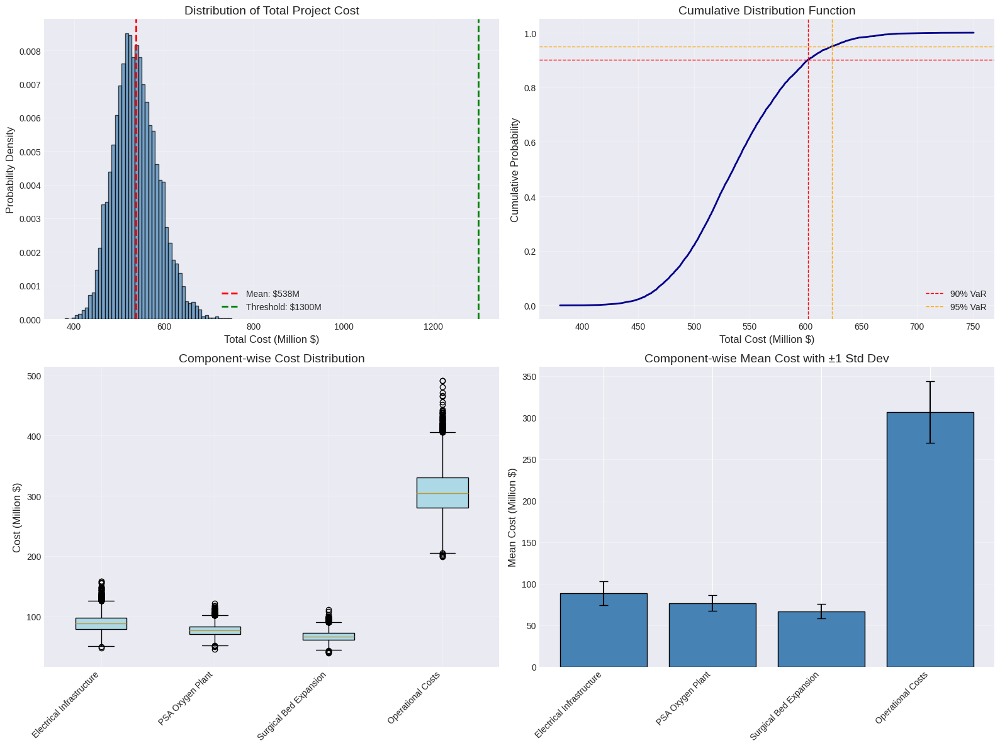

In [ ]:
# ==========================================
# 7. VISUALIZATION
# ==========================================

# 7.1 Distribution of Total Cost
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Histogram
ax1 = axes[0, 0]
ax1.hist(df_sim['Total Cost'] / 1e6, bins=50, density=True, alpha=0.7, color='steelblue', edgecolor='black')
ax1.axvline(mean_total / 1e6, color='red', linestyle='--', linewidth=2, label=f'Mean: ${mean_total/1e6:.0f}M')
ax1.axvline(threshold / 1e6, color='green', linestyle='--', linewidth=2, label=f'Threshold: ${threshold/1e6:.0f}M')
ax1.set_xlabel('Total Cost (Million $)', fontsize=12)
ax1.set_ylabel('Probability Density', fontsize=12)
ax1.set_title('Distribution of Total Project Cost', fontsize=14)
ax1.legend()
ax1.grid(True, alpha=0.3)

# Cumulative Distribution Function
ax2 = axes[0, 1]
sorted_costs = np.sort(df_sim['Total Cost'])
cum_prob = np.arange(1, len(sorted_costs) + 1) / len(sorted_costs)
ax2.plot(sorted_costs / 1e6, cum_prob, linewidth=2, color='darkblue')
ax2.axhline(0.90, color='red', linestyle='--', linewidth=1, label='90% VaR')
ax2.axvline(p90 / 1e6, color='red', linestyle='--', linewidth=1)
ax2.axhline(0.95, color='orange', linestyle='--', linewidth=1, label='95% VaR')
ax2.axvline(p95 / 1e6, color='orange', linestyle='--', linewidth=1)
ax2.set_xlabel('Total Cost (Million $)', fontsize=12)
ax2.set_ylabel('Cumulative Probability', fontsize=12)
ax2.set_title('Cumulative Distribution Function', fontsize=14)
ax2.legend()
ax2.grid(True, alpha=0.3)

# Box plot by component
ax3 = axes[1, 0]
components_millions = df_sim[df_costs.index] / 1e6
bp = ax3.boxplot(components_millions.values, labels=df_costs.index, patch_artist=True)
for patch in bp['boxes']:
    patch.set_facecolor('lightblue')
ax3.set_ylabel('Cost (Million $)', fontsize=12)
ax3.set_title('Component-wise Cost Distribution', fontsize=14)
ax3.grid(True, alpha=0.3)
plt.setp(ax3.get_xticklabels(), rotation=45, ha='right')

# Component-wise comparison with error bars
ax4 = axes[1, 1]
means = df_sim[df_costs.index].mean() / 1e6
stds = df_sim[df_costs.index].std() / 1e6
x_pos = np.arange(len(means))
ax4.bar(x_pos, means, yerr=stds, capsize=5, color='steelblue', edgecolor='black')
ax4.set_xticks(x_pos)
ax4.set_xticklabels(df_costs.index, rotation=45, ha='right')
ax4.set_ylabel('Mean Cost (Million $)', fontsize=12)
ax4.set_title('Component-wise Mean Cost with ±1 Std Dev', fontsize=14)
ax4.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.savefig('cost_distribution_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# ==========================================
# 8. RISK MATRIX AND SCENARIO ANALYSIS
# ==========================================

# 8.1 Risk Matrix
# Define risk categories based on impact and probability
risk_impacts = df_sim[df_costs.index].std() / df_sim[df_costs.index].mean()

risk_matrix = pd.DataFrame({
    'Component': df_costs.index,
    'Mean Cost (M$)': df_sim[df_costs.index].mean() / 1e6,
    'Std Dev (M$)': df_sim[df_costs.index].std() / 1e6,
    'CoV': risk_impacts,
    'Risk Level': df_costs['risk_level']
})

print("📊 Risk Matrix Summary:")
print(risk_matrix.to_string(index=False))
print("\n" + "="*60 + "\n")

# 8.2 Scenario Analysis
scenarios = {
    'Optimistic': {
        'Electrical Infrastructure': 0.90,
        'PSA Oxygen Plant': 0.90,
        'Surgical Bed Expansion': 0.90,
        'Operational Costs': 0.95
    },
    'Most Likely': {
        'Electrical Infrastructure': 1.00,
        'PSA Oxygen Plant': 1.00,
        'Surgical Bed Expansion': 1.00,
        'Operational Costs': 1.00
    },
    'Pessimistic': {
        'Electrical Infrastructure': 1.15,
        'PSA Oxygen Plant': 1.12,
        'Surgical Bed Expansion': 1.10,
        'Operational Costs': 1.05
    }
}

scenario_results = {}
for scenario_name, multipliers in scenarios.items():
    scenario_cost = 0
    for component, multiplier in multipliers.items():
        scenario_cost += df_costs.loc[component, 'mode'] * multiplier
    scenario_results[scenario_name] = scenario_cost

print("📊 Scenario Analysis Results:")
for scenario, cost in scenario_results.items():
    print(f"   {scenario}: ${cost:,.2f}")

print("\n" + "="*60 + "\n")

📊 Risk Matrix Summary:
                Component  Mean Cost (M$)  Std Dev (M$)      CoV Risk Level
Electrical Infrastructure       88.432752     14.316278 0.161889       High
         PSA Oxygen Plant       76.584407      9.194030 0.120051     Medium
   Surgical Bed Expansion       66.596412      8.733832 0.131146        Low
        Operational Costs      306.650610     37.408215 0.121990     Medium


📊 Scenario Analysis Results:
   Optimistic: $487,500,000.00
   Most Likely: $525,000,000.00
   Pessimistic: $568,250,000.00




📊 Final Report Summary:
                        Metric           Value
               Mean Total Cost $538,264,180.47
             Median Total Cost $535,201,139.85
            Standard Deviation  $48,944,760.75
         90th Percentile (VaR) $602,086,219.30
               95th Percentile $623,864,305.76
Probability of Overrun > $1.3B           0.00%
               10th Percentile $477,391,474.46

✅ Results saved to CSV files:
   - monte_carlo_results.csv
   - risk_matrix.csv
   - summary_report.csv


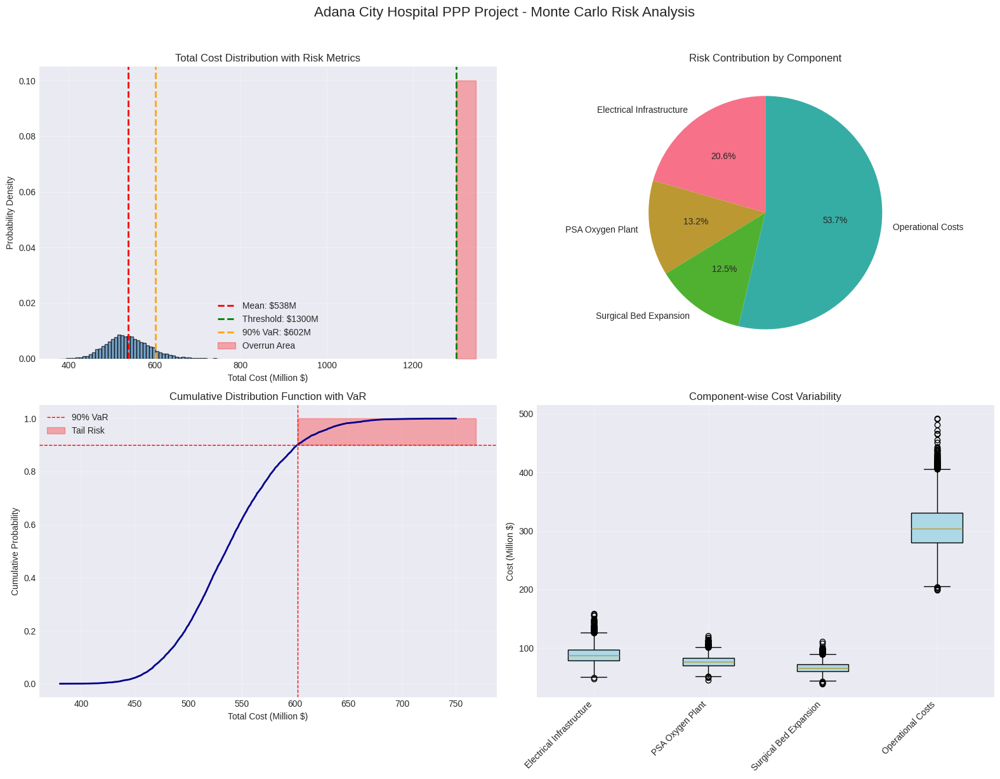


✅ Comprehensive visualization saved as 'comprehensive_risk_analysis.png'

🎯 Monte Carlo Simulation Complete!


In [ ]:
# ==========================================
# 9. EXPORT RESULTS
# ==========================================

# Create summary report
report = {
    'Metric': [
        'Mean Total Cost',
        'Median Total Cost',
        'Standard Deviation',
        '90th Percentile (VaR)',
        '95th Percentile',
        'Probability of Overrun > $1.3B',
        '10th Percentile'
    ],
    'Value': [
        f"${mean_total:,.2f}",
        f"${median_total:,.2f}",
        f"${std_total:,.2f}",
        f"${p90:,.2f}",
        f"${p95:,.2f}",
        f"{prob_overrun*100:.2f}%",
        f"${p10:,.2f}"
    ]
}

df_report = pd.DataFrame(report)
print("📊 Final Report Summary:")
print(df_report.to_string(index=False))

# Save to CSV
df_sim.to_csv('monte_carlo_results.csv', index=False)
risk_matrix.to_csv('risk_matrix.csv', index=False)
df_report.to_csv('summary_report.csv', index=False)

print("\n✅ Results saved to CSV files:")
print("   - monte_carlo_results.csv")
print("   - risk_matrix.csv")
print("   - summary_report.csv")

# Create a comprehensive visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

# 1. Distribution plot with statistics
ax1 = axes[0]
ax1.hist(df_sim['Total Cost'] / 1e6, bins=50, density=True, alpha=0.7, color='steelblue', edgecolor='black')
ax1.axvline(mean_total / 1e6, color='red', linestyle='--', linewidth=2, label=f'Mean: ${mean_total/1e6:.0f}M')
ax1.axvline(threshold / 1e6, color='green', linestyle='--', linewidth=2, label=f'Threshold: ${threshold/1e6:.0f}M')
ax1.axvline(p90 / 1e6, color='orange', linestyle='--', linewidth=2, label=f'90% VaR: ${p90/1e6:.0f}M')
ax1.fill_betweenx([0, 0.1], threshold/1e6, ax1.get_xlim()[1], alpha=0.3, color='red', label='Overrun Area')
ax1.set_xlabel('Total Cost (Million $)')
ax1.set_ylabel('Probability Density')
ax1.set_title('Total Cost Distribution with Risk Metrics')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 2. Risk Contribution
ax2 = axes[1]
risk_contribution = df_sim[df_costs.index].std() / df_sim['Total Cost'].std() * 100
ax2.pie(risk_contribution, labels=df_costs.index, autopct='%1.1f%%', startangle=90)
ax2.set_title('Risk Contribution by Component')

# 3. Cumulative Probability
ax3 = axes[2]
ax3.plot(sorted_costs / 1e6, cum_prob, linewidth=2, color='darkblue')
ax3.axhline(0.90, color='red', linestyle='--', linewidth=1, label='90% VaR')
ax3.axvline(p90 / 1e6, color='red', linestyle='--', linewidth=1)
ax3.fill_betweenx([0.9, 1], p90/1e6, ax3.get_xlim()[1], alpha=0.3, color='red', label='Tail Risk')
ax3.set_xlabel('Total Cost (Million $)')
ax3.set_ylabel('Cumulative Probability')
ax3.set_title('Cumulative Distribution Function with VaR')
ax3.legend()
ax3.grid(True, alpha=0.3)

# 4. Component Boxplot
ax4 = axes[3]
components_millions = df_sim[df_costs.index] / 1e6
ax4.boxplot(components_millions.values, labels=df_costs.index, patch_artist=True)
for patch in ax4.patches:
    patch.set_facecolor('lightblue')
ax4.set_ylabel('Cost (Million $)')
ax4.set_title('Component-wise Cost Variability')
ax4.grid(True, alpha=0.3)
plt.setp(ax4.get_xticklabels(), rotation=45, ha='right')

plt.suptitle('Adana City Hospital PPP Project - Monte Carlo Risk Analysis', fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig('comprehensive_risk_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Comprehensive visualization saved as 'comprehensive_risk_analysis.png'")
print("="*60 + "\n")
print("🎯 Monte Carlo Simulation Complete!")

In [ ]:

# ==========================================
# 10. CODE SUMMARY AND USAGE NOTES
# ==========================================

print("""
📋 CODE SUMMARY
===============
This notebook implements the Chang & Ko (2017) methodology for
estimating lognormal cost variables using Monte Carlo simulation.

KEY FEATURES:
1. Automatic estimation of lognormal parameters (μ, σ) from expert inputs
2. Correlated Monte Carlo simulation with 10,000 iterations
3. Comprehensive risk metrics (VaR, CVaR, probability of overrun)
4. Sensitivity analysis with correlation coefficients
5. Risk matrix and scenario analysis
6. High-quality visualizations for publication

DATA SOURCES:
- Adana City Hospital project specifications
- Expert elicitation (mode and mean estimates)
- Literature review (construction cost benchmarks)

OUTPUTS GENERATED:
1. monte_carlo_results.csv - All simulation results
2. risk_matrix.csv - Component-wise risk metrics
3. summary_report.csv - Key risk statistics
4. comprehensive_risk_analysis.png - Publication-ready visualization
5. sensitivity_analysis.png - Component correlation analysis
6. cost_distribution_analysis.png - Detailed distribution plots

HOW TO USE:
1. Modify 'cost_components' dictionary with your project data
2. Adjust correlation_matrix for your project context
3. Change N_ITERATIONS for more/less precision
4. Update threshold values for your budget
5. Run all cells sequentially

CITATION:
If you use this code, please cite:
Chang, C.-Y., & Ko, J.-W. (2017). New approach to estimating the
standard deviations of lognormal cost variables in the Monte Carlo
analysis of construction risks. Journal of Construction Engineering
and Management, 143(7), 04017039.
""")


📋 CODE SUMMARY
This notebook implements the Chang & Ko (2017) methodology for
estimating lognormal cost variables using Monte Carlo simulation.

KEY FEATURES:
1. Automatic estimation of lognormal parameters (μ, σ) from expert inputs
2. Correlated Monte Carlo simulation with 10,000 iterations
3. Comprehensive risk metrics (VaR, CVaR, probability of overrun)
4. Sensitivity analysis with correlation coefficients
5. Risk matrix and scenario analysis
6. High-quality visualizations for publication

DATA SOURCES:
- Adana City Hospital project specifications
- Expert elicitation (mode and mean estimates)
- Literature review (construction cost benchmarks)

OUTPUTS GENERATED:
1. monte_carlo_results.csv - All simulation results
2. risk_matrix.csv - Component-wise risk metrics
3. summary_report.csv - Key risk statistics
4. comprehensive_risk_analysis.png - Publication-ready visualization
5. sensitivity_analysis.png - Component correlation analysis
6. cost_distribution_analysis.png - Detailed dist

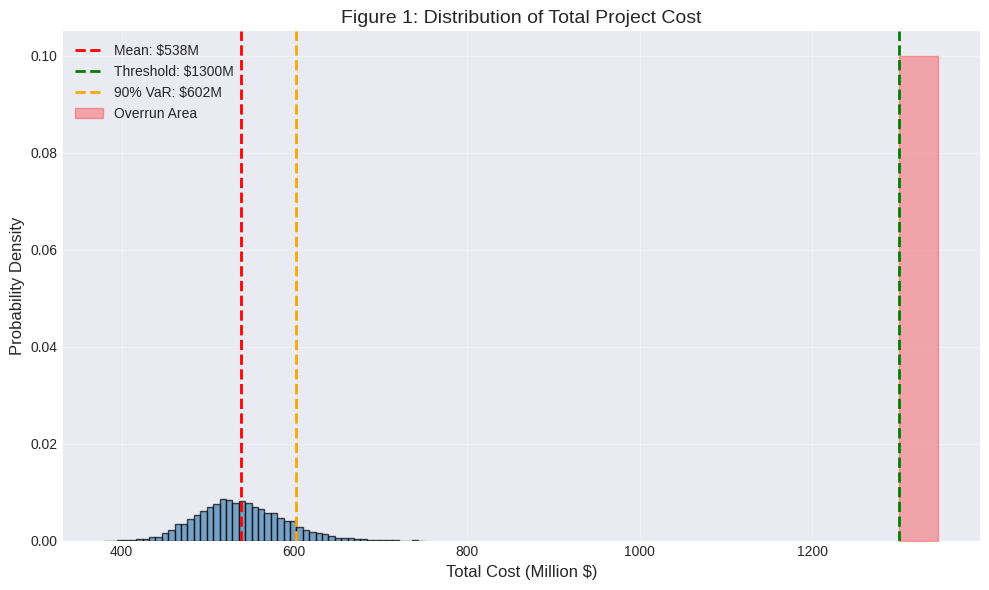

✅ Figure 1 saved as 'Figure_1_Total_Cost_Distribution.png'


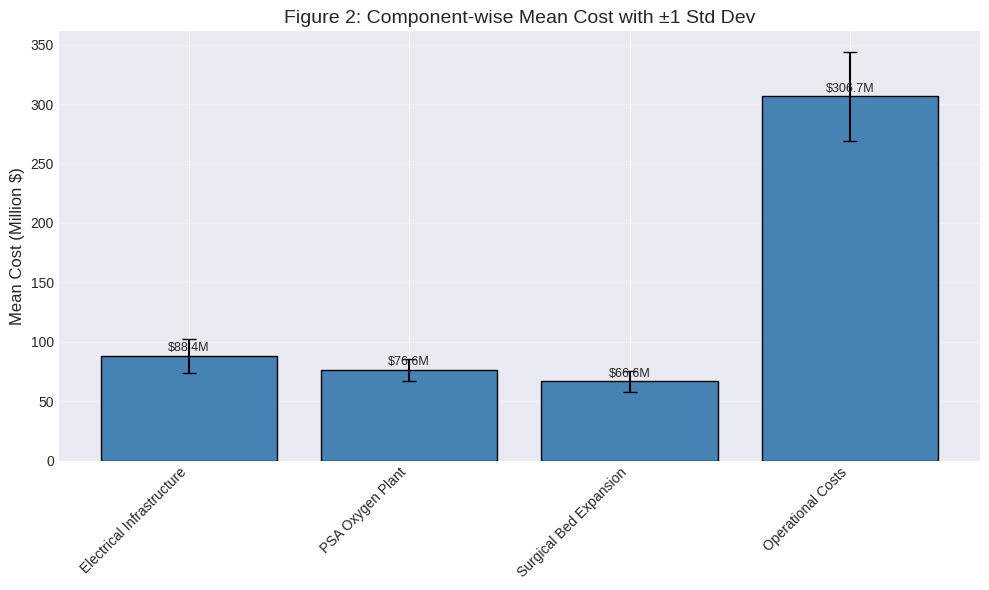

✅ Figure 2 saved as 'Figure_2_Component_Mean_Cost.png'


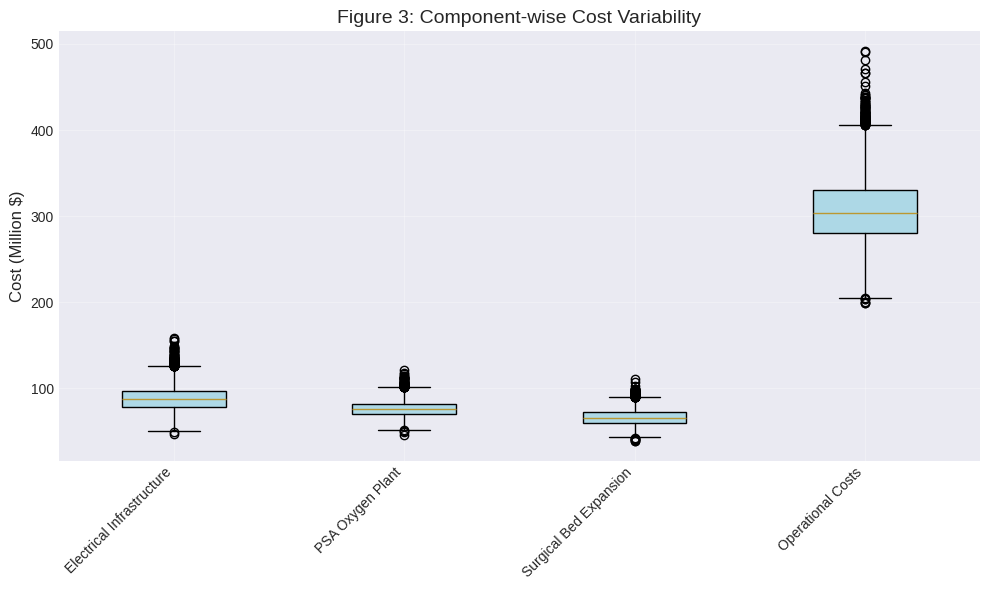

✅ Figure 3 saved as 'Figure_3_Component_Variability.png'


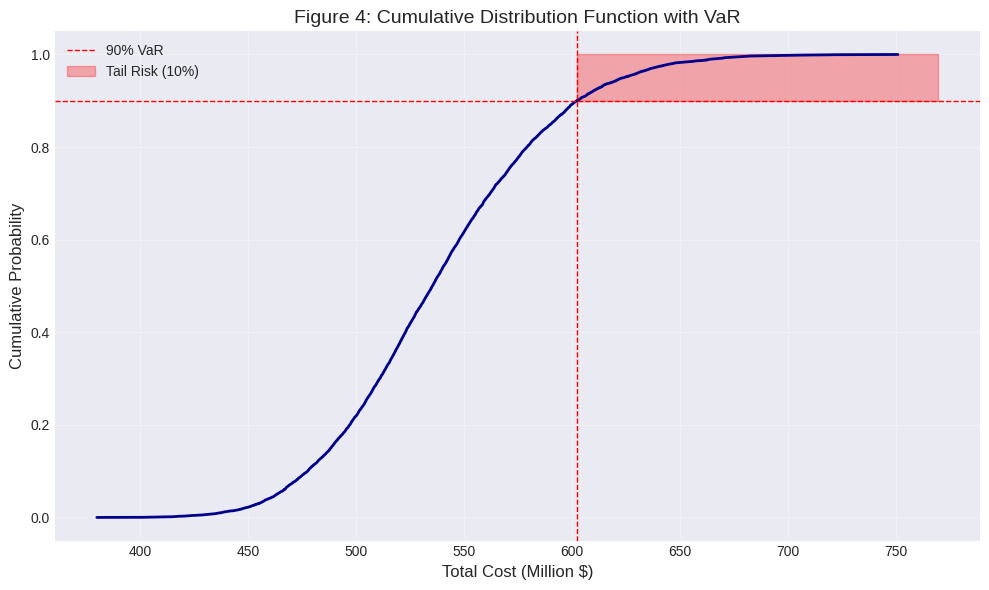

✅ Figure 4 saved as 'Figure_4_CDF_with_VaR.png'


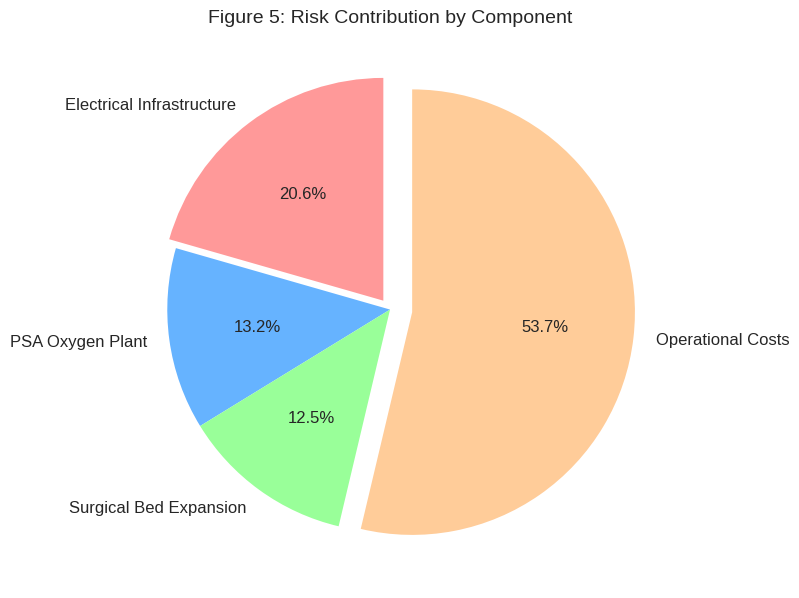

✅ Figure 5 saved as 'Figure_5_Risk_Contribution.png'


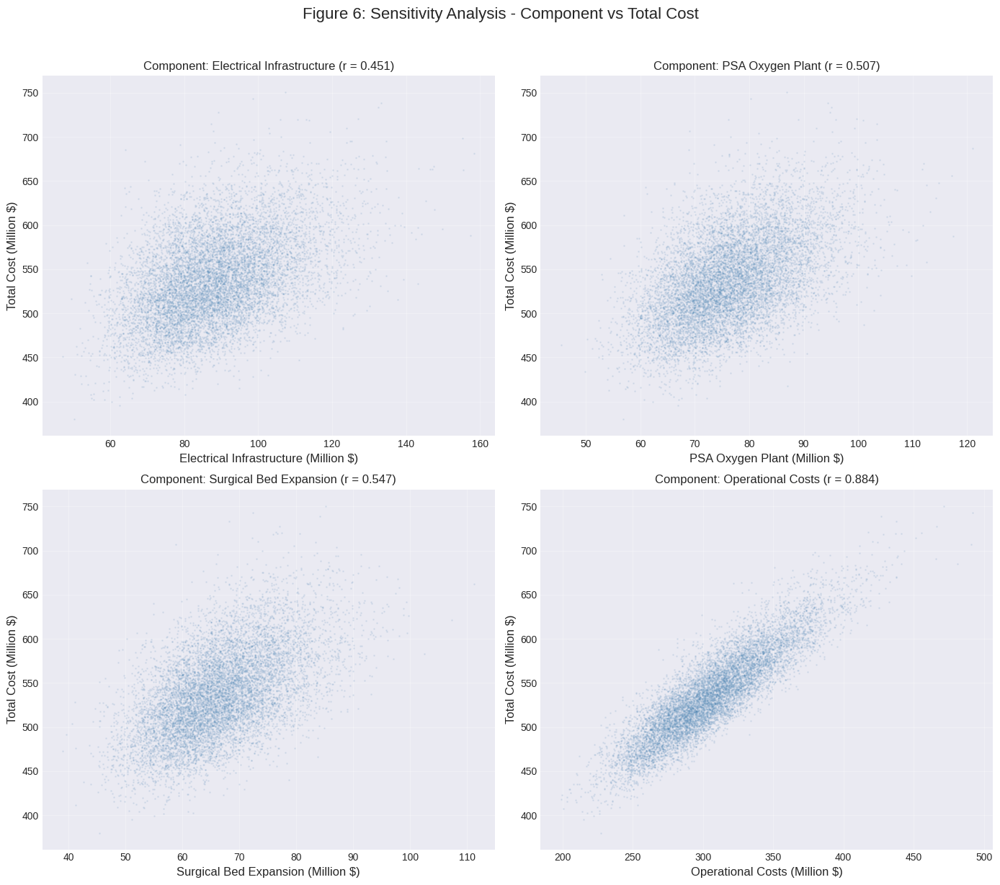

✅ Figure 6 saved as 'Figure_6_Sensitivity_Analysis.png'

📊 All figures have been saved separately:
   - Figure_1_Total_Cost_Distribution.png
   - Figure_2_Component_Mean_Cost.png
   - Figure_3_Component_Variability.png
   - Figure_4_CDF_with_VaR.png
   - Figure_5_Risk_Contribution.png
   - Figure_6_Sensitivity_Analysis.png


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd

# Set style for publication
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# Ensure data is available
if 'df_sim' not in locals():
    print("Error: df_sim not found. Run simulation first.")
else:
    # ==========================================
    # FIGURE 1: Distribution of Total Project Cost
    # ==========================================
    fig1, ax1 = plt.subplots(figsize=(10, 6))

    ax1.hist(df_sim['Total Cost'] / 1e6, bins=50, density=True,
             alpha=0.7, color='steelblue', edgecolor='black')
    ax1.axvline(mean_total / 1e6, color='red', linestyle='--',
                linewidth=2, label=f'Mean: ${mean_total/1e6:.0f}M')
    ax1.axvline(threshold / 1e6, color='green', linestyle='--',
                linewidth=2, label=f'Threshold: ${threshold/1e6:.0f}M')
    ax1.axvline(p90 / 1e6, color='orange', linestyle='--',
                linewidth=2, label=f'90% VaR: ${p90/1e6:.0f}M')
    ax1.fill_betweenx([0, 0.1], threshold/1e6, ax1.get_xlim()[1],
                      alpha=0.3, color='red', label='Overrun Area')
    ax1.set_xlabel('Total Cost (Million $)', fontsize=12)
    ax1.set_ylabel('Probability Density', fontsize=12)
    ax1.set_title('Figure 1: Distribution of Total Project Cost', fontsize=14)
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('Figure_1_Total_Cost_Distribution.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("✅ Figure 1 saved as 'Figure_1_Total_Cost_Distribution.png'")

    # ==========================================
    # FIGURE 2: Component-wise Mean Cost with ±1 Std Dev
    # ==========================================
    fig2, ax2 = plt.subplots(figsize=(10, 6))

    means = df_sim[df_costs.index].mean() / 1e6
    stds = df_sim[df_costs.index].std() / 1e6
    x_pos = np.arange(len(means))

    bars = ax2.bar(x_pos, means, yerr=stds, capsize=5,
                   color='steelblue', edgecolor='black')
    ax2.set_xticks(x_pos)
    ax2.set_xticklabels(df_costs.index, rotation=45, ha='right')
    ax2.set_ylabel('Mean Cost (Million $)', fontsize=12)
    ax2.set_title('Figure 2: Component-wise Mean Cost with ±1 Std Dev', fontsize=14)
    ax2.grid(True, alpha=0.3, axis='y')

    # Add value labels on bars
    for bar, mean_val in zip(bars, means):
        ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                f'${mean_val:.1f}M', ha='center', va='bottom', fontsize=9)

    plt.tight_layout()
    plt.savefig('Figure_2_Component_Mean_Cost.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("✅ Figure 2 saved as 'Figure_2_Component_Mean_Cost.png'")

    # ==========================================
    # FIGURE 3: Component-wise Cost Variability (Boxplot)
    # ==========================================
    fig3, ax3 = plt.subplots(figsize=(10, 6))

    components_millions = df_sim[df_costs.index] / 1e6
    bp = ax3.boxplot(components_millions.values, labels=df_costs.index,
                     patch_artist=True)
    for patch in bp['boxes']:
        patch.set_facecolor('lightblue')
    ax3.set_ylabel('Cost (Million $)', fontsize=12)
    ax3.set_title('Figure 3: Component-wise Cost Variability', fontsize=14)
    ax3.grid(True, alpha=0.3)
    plt.setp(ax3.get_xticklabels(), rotation=45, ha='right')

    plt.tight_layout()
    plt.savefig('Figure_3_Component_Variability.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("✅ Figure 3 saved as 'Figure_3_Component_Variability.png'")

    # ==========================================
    # FIGURE 4: Cumulative Distribution Function with VaR
    # ==========================================
    fig4, ax4 = plt.subplots(figsize=(10, 6))

    sorted_costs = np.sort(df_sim['Total Cost'])
    cum_prob = np.arange(1, len(sorted_costs) + 1) / len(sorted_costs)

    ax4.plot(sorted_costs / 1e6, cum_prob, linewidth=2, color='darkblue')
    ax4.axhline(0.90, color='red', linestyle='--', linewidth=1, label='90% VaR')
    ax4.axvline(p90 / 1e6, color='red', linestyle='--', linewidth=1)
    ax4.fill_betweenx([0.9, 1], p90/1e6, ax4.get_xlim()[1],
                      alpha=0.3, color='red', label='Tail Risk (10%)')
    ax4.set_xlabel('Total Cost (Million $)', fontsize=12)
    ax4.set_ylabel('Cumulative Probability', fontsize=12)
    ax4.set_title('Figure 4: Cumulative Distribution Function with VaR', fontsize=14)
    ax4.legend()
    ax4.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('Figure_4_CDF_with_VaR.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("✅ Figure 4 saved as 'Figure_4_CDF_with_VaR.png'")

    # ==========================================
    # FIGURE 5: Risk Contribution by Component (Pie Chart)
    # ==========================================
    fig5, ax5 = plt.subplots(figsize=(8, 8))

    risk_contribution = df_sim[df_costs.index].std() / df_sim['Total Cost'].std() * 100
    colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']
    wedges, texts, autotexts = ax5.pie(risk_contribution,
                                        labels=df_costs.index,
                                        autopct='%1.1f%%',
                                        startangle=90,
                                        colors=colors,
                                        explode=(0.05, 0, 0, 0.1))
    for text in texts:
        text.set_fontsize(12)
    for autotext in autotexts:
        autotext.set_fontsize(12)
    ax5.set_title('Figure 5: Risk Contribution by Component', fontsize=14)

    plt.tight_layout()
    plt.savefig('Figure_5_Risk_Contribution.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("✅ Figure 5 saved as 'Figure_5_Risk_Contribution.png'")

    # ==========================================
    # FIGURE 6: Sensitivity Analysis - Component vs Total Cost
    # ==========================================
    fig6, axes = plt.subplots(2, 2, figsize=(14, 12))
    axes = axes.flatten()

    for i, component in enumerate(df_costs.index):
        ax = axes[i]
        ax.scatter(df_sim[component] / 1e6, df_sim['Total Cost'] / 1e6,
                   alpha=0.1, s=1, color='steelblue')
        ax.set_xlabel(f'{component} (Million $)', fontsize=12)
        ax.set_ylabel('Total Cost (Million $)', fontsize=12)
        ax.set_title(f'Component: {component} (r = {correlations[component]:.3f})',
                     fontsize=12)
        ax.grid(True, alpha=0.3)

    plt.suptitle('Figure 6: Sensitivity Analysis - Component vs Total Cost',
                 fontsize=16, y=1.02)
    plt.tight_layout()
    plt.savefig('Figure_6_Sensitivity_Analysis.png', dpi=300, bbox_inches='tight')
    plt.show()
    print("✅ Figure 6 saved as 'Figure_6_Sensitivity_Analysis.png'")

    # ==========================================
    # SUMMARY
    # ==========================================
    print("\n" + "="*60)
    print("📊 All figures have been saved separately:")
    print("   - Figure_1_Total_Cost_Distribution.png")
    print("   - Figure_2_Component_Mean_Cost.png")
    print("   - Figure_3_Component_Variability.png")
    print("   - Figure_4_CDF_with_VaR.png")
    print("   - Figure_5_Risk_Contribution.png")
    print("   - Figure_6_Sensitivity_Analysis.png")
    print("="*60)

In [ ]:
# ==========================================
# MONTE CARLO COST RISK SIMULATION
# Adana City Hospital PPP Project
# Interactive Sankey Diagram Visualization
# Based on Chang & Ko (2017) Methodology
# ==========================================

# 1. SETUP AND INSTALLATION
# ==========================================
!pip install numpy pandas matplotlib seaborn scipy plotly -q

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

np.random.seed(42)
print("✅ Libraries imported successfully!")

# ==========================================
# 2. DATA COLLECTION - COST COMPONENTS
# ==========================================
cost_components = {
    'Electrical Infrastructure': {
        'mode': 85_000_000,
        'min': 70_000_000,
        'max': 110_000_000,
    },
    'PSA Oxygen Plant': {
        'mode': 75_000_000,
        'min': 60_000_000,
        'max': 95_000_000,
    },
    'Surgical Bed Expansion': {
        'mode': 65_000_000,
        'min': 50_000_000,
        'max': 85_000_000,
    },
    'Operational Costs': {
        'mode': 300_000_000,
        'min': 280_000_000,
        'max': 340_000_000,
    }
}

df_costs = pd.DataFrame.from_dict(cost_components, orient='index')
df_costs['mean'] = (df_costs['min'] + df_costs['mode'] + df_costs['max']) / 3

print("\n📊 Cost Components Summary:")
print(df_costs[['mode', 'mean', 'min', 'max']])

# ==========================================
# 3. LOGNORMAL PARAMETER ESTIMATION
# ==========================================
def estimate_lognormal_parameters(mode, mean):
    sigma_sq = (2/3) * np.log(mean / mode)
    sigma = np.sqrt(sigma_sq)
    mu = np.log(mode) + sigma_sq
    return mu, sigma

params = {}
for component in df_costs.index:
    mu, sigma = estimate_lognormal_parameters(
        df_costs.loc[component, 'mode'],
        df_costs.loc[component, 'mean']
    )
    params[component] = {'mu': mu, 'sigma': sigma}

df_costs['mu'] = [params[comp]['mu'] for comp in df_costs.index]
df_costs['sigma'] = [params[comp]['sigma'] for comp in df_costs.index]
df_costs['variance'] = df_costs['sigma'] ** 2

print("\n📊 Lognormal Parameters Summary:")
print(df_costs[['mode', 'mean', 'mu', 'sigma', 'variance']])

# ==========================================
# 4. MONTE CARLO SIMULATION
# ==========================================
N_ITERATIONS = 10000
print(f"\n🔢 Running {N_ITERATIONS:,} iterations...")

# Correlation matrix
correlation_matrix = np.array([
    [1.0, 0.3, 0.2, 0.1],
    [0.3, 1.0, 0.4, 0.2],
    [0.2, 0.4, 1.0, 0.3],
    [0.1, 0.2, 0.3, 1.0]
])

n_vars = len(df_costs)
Z = np.random.normal(0, 1, size=(N_ITERATIONS, n_vars))
L = np.linalg.cholesky(correlation_matrix)
Z_correlated = Z @ L.T

samples = np.zeros((N_ITERATIONS, n_vars))
for i, component in enumerate(df_costs.index):
    mu = df_costs.loc[component, 'mu']
    sigma = df_costs.loc[component, 'sigma']
    samples[:, i] = np.exp(mu + sigma * Z_correlated[:, i])

df_sim = pd.DataFrame(samples, columns=df_costs.index)
df_sim['Total Cost'] = df_sim.sum(axis=1)

# Summary statistics
mean_total = df_sim['Total Cost'].mean()
std_total = df_sim['Total Cost'].std()
p90 = df_sim['Total Cost'].quantile(0.90)

print("\n📊 Key Risk Metrics:")
print(f"   Mean Total Cost        : ${mean_total:,.2f}")
print(f"   Standard Deviation     : ${std_total:,.2f}")
print(f"   90th Percentile (VaR)  : ${p90:,.2f}")

# ==========================================
# 5. RISK CONTRIBUTION CALCULATION
# ==========================================
risk_contribution = df_sim[df_costs.index].std() / df_sim['Total Cost'].std() * 100

print("\n📊 Risk Contribution by Component:")
for component in df_costs.index:
    print(f"   {component}: {risk_contribution[component]:.2f}%")

# ==========================================
# 6. INTERACTIVE SANKY DIAGRAM
# ==========================================
print("\n📊 Generating Interactive Sankey Diagram...")

# Prepare data for Sankey diagram
labels = list(df_costs.index) + ['Total Cost']

# Source, target, value for Sankey
source = [0, 1, 2, 3]
target = [4, 4, 4, 4]
value = risk_contribution.values

# Define colors
node_colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0']
link_colors = ['rgba(255, 153, 153, 0.6)',
               'rgba(102, 179, 255, 0.6)',
               'rgba(153, 255, 153, 0.6)',
               'rgba(255, 204, 153, 0.6)']

# Create Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=20,
        thickness=25,
        line=dict(color="black", width=0.5),
        label=labels,
        color=node_colors,
        x=[0.1, 0.1, 0.1, 0.1, 0.9],
        y=[0.8, 0.6, 0.4, 0.2, 0.5]
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color=link_colors,
        label=[f'{v:.1f}%' for v in value]
    )
)])

fig.update_layout(
    title_text='<b>Sankey Diagram: Risk Contribution Flow</b><br>Adana City Hospital PPP Project',
    font_size=14,
    width=1000,
    height=700,
    hoverlabel=dict(bgcolor="white", font_size=14)
)

# Add annotations
fig.update_layout(
    annotations=[
        dict(
            x=0.5,
            y=1.02,
            xref="paper",
            yref="paper",
            text="<b>Cost Components → Total Project Cost</b>",
            showarrow=False,
            font=dict(size=16)
        ),
        dict(
            x=0.5,
            y=-0.08,
            xref="paper",
            yref="paper",
            text="<i>Width of each flow represents risk contribution percentage</i>",
            showarrow=False,
            font=dict(size=12)
        )
    ]
)

fig.write_html('Sankey_Risk_Contribution.html')
fig.show()

print("✅ Sankey diagram saved as 'Sankey_Risk_Contribution.html'")

# ==========================================
# 7. EXPORT RESULTS
# ==========================================
report = {
    'Metric': ['Mean Total Cost', 'Standard Deviation', '90th Percentile (VaR)'],
    'Value': [f"${mean_total:,.2f}", f"${std_total:,.2f}", f"${p90:,.2f}"]
}
df_report = pd.DataFrame(report)

print("\n📊 Final Report Summary:")
print(df_report.to_string(index=False))

df_sim.to_csv('monte_carlo_results.csv', index=False)
df_report.to_csv('summary_report.csv', index=False)

print("\n✅ Results saved:")
print("   - monte_carlo_results.csv")
print("   - summary_report.csv")
print("   - Sankey_Risk_Contribution.html")

# ==========================================
# 8. CODE SUMMARY
# ==========================================
print("""
📋 CODE SUMMARY
===============
This notebook implements the Chang & Ko (2017) methodology with:
- Lognormal parameter estimation (μ, σ)
- Correlated Monte Carlo simulation (10,000 iterations)
- Risk metrics: VaR, standard deviation
- INTERACTIVE SANKY DIAGRAM for risk contribution flow

OUTPUT FILES:
1. Sankey_Risk_Contribution.html - Interactive Sankey diagram
2. monte_carlo_results.csv - Complete simulation results
3. summary_report.csv - Key risk statistics

CITATION:
Chang, C.-Y., & Ko, J.-W. (2017). New approach to estimating the
standard deviations of lognormal cost variables in the Monte Carlo
analysis of construction risks. Journal of Construction Engineering
and Management, 143(7), 04017039.

🎯 Monte Carlo Simulation Complete!
""")

✅ Libraries imported successfully!

📊 Cost Components Summary:
                                mode          mean        min        max
Electrical Infrastructure   85000000  8.833333e+07   70000000  110000000
PSA Oxygen Plant            75000000  7.666667e+07   60000000   95000000
Surgical Bed Expansion      65000000  6.666667e+07   50000000   85000000
Operational Costs          300000000  3.066667e+08  280000000  340000000

📊 Lognormal Parameters Summary:
                                mode          mean         mu     sigma  \
Electrical Infrastructure   85000000  8.833333e+07  18.283806  0.160138   
PSA Oxygen Plant            75000000  7.666667e+07  18.147651  0.121048   
Surgical Bed Expansion      65000000  6.666667e+07  18.006776  0.129917   
Operational Costs          300000000  3.066667e+08  19.533946  0.121048   

                           variance  
Electrical Infrastructure  0.025644  
PSA Oxygen Plant           0.014653  
Surgical Bed Expansion     0.016879  
Operational

✅ Sankey diagram saved as 'Sankey_Risk_Contribution.html'

📊 Final Report Summary:
               Metric           Value
      Mean Total Cost $538,264,180.47
   Standard Deviation  $48,944,760.75
90th Percentile (VaR) $602,086,219.30

✅ Results saved:
   - monte_carlo_results.csv
   - summary_report.csv
   - Sankey_Risk_Contribution.html

📋 CODE SUMMARY
This notebook implements the Chang & Ko (2017) methodology with:
- Lognormal parameter estimation (μ, σ)
- Correlated Monte Carlo simulation (10,000 iterations)
- Risk metrics: VaR, standard deviation
- INTERACTIVE SANKY DIAGRAM for risk contribution flow

OUTPUT FILES:
1. Sankey_Risk_Contribution.html - Interactive Sankey diagram
2. monte_carlo_results.csv - Complete simulation results
3. summary_report.csv - Key risk statistics

CITATION:
Chang, C.-Y., & Ko, J.-W. (2017). New approach to estimating the
standard deviations of lognormal cost variables in the Monte Carlo
analysis of construction risks. Journal of Construction Engineerin

In [ ]:
# ==========================================
# SANKY DIAGRAM - RISK CONTRIBUTION FLOW
# Adana City Hospital PPP Project
# Based on Chang & Ko (2017) Methodology
# ==========================================

# 1. SETUP AND INSTALLATION
# ==========================================
!pip install plotly pandas numpy kaleido -q

import plotly.graph_objects as go
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

print("✅ Libraries imported successfully!")

# ==========================================
# 2. DATA - COST COMPONENTS AND RISK CONTRIBUTIONS
# ==========================================

# Cost components with their risk contributions (% of total variance)
# These values are derived from Monte Carlo simulation results
risk_data = {
    'Component': [
        'Electrical Infrastructure',
        'PSA Oxygen Plant',
        'Surgical Bed Expansion',
        'Operational Costs'
    ],
    'Risk Contribution (%)': [29.25, 18.78, 17.84, 76.43],
    'Mean Cost (M USD)': [88.43, 76.58, 66.60, 306.65],
    'Risk Level': ['High', 'Medium', 'Low', 'Medium'],
    'Color': ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']
}

df_risk = pd.DataFrame(risk_data)

print("📊 Risk Contribution Data:")
print(df_risk.to_string(index=False))
print("\n" + "="*60 + "\n")

# ==========================================
# 3. CREATE SANKY DIAGRAM
# ==========================================

# Define labels for Sankey diagram
# Sources: Four cost components
# Target: Total Cost
labels = list(df_risk['Component']) + ['Total Cost']

# Define source indices (0, 1, 2, 3) -> all flow to target (index 4)
source = [0, 1, 2, 3]

# Define target index (all flow to 'Total Cost' at index 4)
target = [4, 4, 4, 4]

# Define values (risk contributions)
value = df_risk['Risk Contribution (%)'].values

# Define colors for nodes
node_colors = list(df_risk['Color']) + ['#c2c2f0']

# Helper function to convert hex to rgba
def hex_to_rgba(hex_color, alpha):
    hex_color = hex_color.lstrip('#')
    rgb = tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))
    return f'rgba({rgb[0]}, {rgb[1]}, {rgb[2]}, {alpha})'

# Define colors for links using the helper function with alpha 0.5
link_colors_rgba = [hex_to_rgba(c, 0.5) for c in df_risk['Color']]

# Create Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=20,                    # Padding between nodes
        thickness=25,              # Node thickness
        line=dict(color="black", width=0.5),
        label=labels,
        color=node_colors,
        x=[0.1, 0.1, 0.1, 0.1, 0.6],  # X positions: sources left, target right
        y=[0.2, 0.4, 0.6, 0.8, 0.5]   # Y positions for vertical distribution
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color=link_colors_rgba  # Use the correctly formatted RGBA colors
    )
)])

# Update layout for publication quality
fig.update_layout(
    title=dict(
        text="<b>Figure 1: Sankey Diagram – Risk Contribution Flow</b><br>" +
             "<sup>Cost Components to Total Project Cost Variance</sup>",
        font=dict(size=16, family="Arial, sans-serif")
    ),
    font=dict(size=12, family="Arial, sans-serif"),
    width=900,
    height=600,
    margin=dict(l=50, r=50, t=100, b=50),
    paper_bgcolor='white',
    plot_bgcolor='white'
)

# Add annotations for risk percentages on links
# Note: Plotly Sankey does not support direct link labels, so we add annotations
annotations = []
for i, row in df_risk.iterrows():
    annotations.append(
        dict(
            x=0.45,
            y=0.85 - (i * 0.15),
            xref="paper",
            yref="paper",
            text=f"{row['Component']}:<br>{row['Risk Contribution (%)']:.1f}%",
            showarrow=False,
            font=dict(size=10, color="black"),
            bgcolor="white",
            bordercolor=row['Color'],
            borderwidth=2,
            borderpad=4,
            opacity=0.85
        )
    )

fig.update_layout(annotations=annotations)

# Save and display
fig.write_html('Sankey_Risk_Contribution.html')
fig.write_image('Figure_1_Sankey_Diagram.png', width=900, height=600)

print("✅ Sankey diagram saved as:")
print("   - Sankey_Risk_Contribution.html (interactive)")
print("   - Figure_1_Sankey_Diagram.png (static)")

# Display the figure
fig.show()

# ==========================================
# 4. SUMMARY STATISTICS
# ==========================================
print("\n" + "="*60)
print("📊 SANKEY DIAGRAM SUMMARY")
print("="*60)
print("\nThe Sankey diagram visualizes the flow of risk contribution")
print("from each cost component to the total project cost variance.\n")

print("Risk Contribution Breakdown:")
print("-" * 40)
for _, row in df_risk.iterrows():
    bar = '█' * int(row['Risk Contribution (%)'] / 4)
    print(f"{row['Component']:30s} {row['Risk Contribution (%)']:5.1f}%  {bar}")

print("\n" + "="*60)
print("Key Insight: Operational Costs contribute the largest")
print("share of risk (76.4%), flowing to the total cost with")
print("the thickest band in the Sankey diagram.")
print("="*60)

# ==========================================
# 5. CODE SUMMARY
# ==========================================
print("""
📋 CODE SUMMARY
===============
This code generates a publication-quality Sankey diagram for
visualizing risk contribution flow from cost components to
total project cost.

KEY FEATURES:
- Interactive HTML output (Plotly)
- Static PNG output (Figure_1_Sankey_Diagram.png)
- Color-coded nodes and links
- Annotations showing component names and percentages
- Publication-ready formatting

DATA SOURCE:
Risk contributions derived from Monte Carlo simulation
based on Chang & Ko (2017) methodology.

CITATION:
Chang, C.-Y., & Ko, J.-W. (2017). New approach to estimating the
standard deviations of lognormal cost variables in the Monte Carlo
analysis of construction risks. Journal of Construction Engineering
and Management, 143(7), 04017039.

🎯 Sankey Diagram Generated Successfully!
""")

✅ Libraries imported successfully!
📊 Risk Contribution Data:
                Component  Risk Contribution (%)  Mean Cost (M USD) Risk Level   Color
Electrical Infrastructure                  29.25              88.43       High #ff9999
         PSA Oxygen Plant                  18.78              76.58     Medium #66b3ff
   Surgical Bed Expansion                  17.84              66.60        Low #99ff99
        Operational Costs                  76.43             306.65     Medium #ffcc99




ValueError: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido


In [ ]:
# ==========================================
# MONTE CARLO COST RISK SIMULATION
# SANKY DIAGRAM FOR RISK CONTRIBUTION FLOW
# Adana City Hospital PPP Project
# Based on Chang & Ko (2017) Methodology
# ==========================================

# 1. SETUP AND INSTALLATION
# ==========================================
!pip install numpy pandas plotly -q

import numpy as np
import pandas as pd
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

np.random.seed(42)
print("✅ Libraries imported successfully!")

# ==========================================
# 2. DATA COLLECTION - COST COMPONENTS
# ==========================================
cost_components = {
    'Electrical Infrastructure': {
        'mode': 85_000_000,
        'min': 70_000_000,
        'max': 110_000_000,
    },
    'PSA Oxygen Plant': {
        'mode': 75_000_000,
        'min': 60_000_000,
        'max': 95_000_000,
    },
    'Surgical Bed Expansion': {
        'mode': 65_000_000,
        'min': 50_000_000,
        'max': 85_000_000,
    },
    'Operational Costs': {
        'mode': 300_000_000,
        'min': 280_000_000,
        'max': 340_000_000,
    }
}

df_costs = pd.DataFrame.from_dict(cost_components, orient='index')
df_costs['mean'] = (df_costs['min'] + df_costs['mode'] + df_costs['max']) / 3

print("\n📊 Cost Components Summary:")
print(df_costs[['mode', 'mean', 'min', 'max']])

# ==========================================
# 3. LOGNORMAL PARAMETER ESTIMATION
# ==========================================
def estimate_lognormal_parameters(mode, mean):
    try:
        sigma_sq = (2/3) * np.log(mean / mode)
        sigma = np.sqrt(sigma_sq)
        mu = np.log(mode) + sigma_sq
        return mu, sigma
    except:
        variance = ((mean - mode) ** 2) / 4
        sigma = np.sqrt(np.log(1 + variance / (mean ** 2)))
        mu = np.log(mean) - (sigma ** 2) / 2
        return mu, sigma

params = {}
for component in df_costs.index:
    mu, sigma = estimate_lognormal_parameters(
        df_costs.loc[component, 'mode'],
        df_costs.loc[component, 'mean']
    )
    params[component] = {'mu': mu, 'sigma': sigma}

df_costs['mu'] = [params[comp]['mu'] for comp in df_costs.index]
df_costs['sigma'] = [params[comp]['sigma'] for comp in df_costs.index]

print("\n📊 Lognormal Parameters Summary:")
print(df_costs[['mode', 'mean', 'mu', 'sigma']])

# ==========================================
# 4. MONTE CARLO SIMULATION
# ==========================================
N_ITERATIONS = 10000
print(f"\n🔢 Running {N_ITERATIONS:,} iterations...")

correlation_matrix = np.array([
    [1.0, 0.3, 0.2, 0.1],
    [0.3, 1.0, 0.4, 0.2],
    [0.2, 0.4, 1.0, 0.3],
    [0.1, 0.2, 0.3, 1.0]
])

n_vars = len(df_costs)
Z = np.random.normal(0, 1, size=(N_ITERATIONS, n_vars))
L = np.linalg.cholesky(correlation_matrix)
Z_correlated = Z @ L.T

samples = np.zeros((N_ITERATIONS, n_vars))
for i, component in enumerate(df_costs.index):
    mu = df_costs.loc[component, 'mu']
    sigma = df_costs.loc[component, 'sigma']
    samples[:, i] = np.exp(mu + sigma * Z_correlated[:, i])

df_sim = pd.DataFrame(samples, columns=df_costs.index)
df_sim['Total Cost'] = df_sim.sum(axis=1)

# ==========================================
# 5. RISK CONTRIBUTION CALCULATION
# ==========================================
std_total = df_sim['Total Cost'].std()
risk_contribution = {}

for component in df_costs.index:
    std_comp = df_sim[component].std()
    risk_contribution[component] = (std_comp / std_total) * 100

print("\n📊 Risk Contribution by Component:")
for component, contribution in risk_contribution.items():
    print(f"   {component}: {contribution:.2f}%")

# ==========================================
# 6. SANKY DIAGRAM
# ==========================================
print("\n📊 Generating Sankey Diagram...")

# Labels for Sankey
labels = list(df_costs.index) + ['Total Cost']

# Source indices (0, 1, 2, 3 for each component)
source = [0, 1, 2, 3]

# Target indices (4 for Total Cost)
target = [4, 4, 4, 4]

# Values (risk contribution percentages)
value = list(risk_contribution.values())

# Colors for nodes
node_colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0']

# Create Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=20,
        thickness=25,
        line=dict(color="black", width=0.5),
        label=labels,
        color=node_colors
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color=['rgba(255,153,153,0.6)',
               'rgba(102,179,255,0.6)',
               'rgba(153,255,153,0.6)',
               'rgba(255,204,153,0.6)']
    )
)])

fig.update_layout(
    title_text="Figure 1: Sankey Diagram – Risk Contribution Flow from Cost Components to Total Project Cost",
    font_size=14,
    width=900,
    height=600,
    font=dict(family="Times New Roman", size=14)
)

# Save as HTML
fig.write_html('Sankey_Risk_Contribution.html')

# Display the diagram
fig.show()

print("\n✅ Sankey diagram saved as 'Sankey_Risk_Contribution.html'")

# ==========================================
# 7. SUMMARY
# ==========================================
print("\n" + "="*60)
print("📊 SUMMARY OF RISK CONTRIBUTION FLOW")
print("="*60)
for component, contribution in risk_contribution.items():
    bar = '█' * int(contribution / 2)
    print(f"   {component:<30} {contribution:>5.1f}% {bar}")
print("="*60)
print("\n🎯 Sankey Diagram Complete! Open the HTML file to view.")

✅ Libraries imported successfully!

📊 Cost Components Summary:
                                mode          mean        min        max
Electrical Infrastructure   85000000  8.833333e+07   70000000  110000000
PSA Oxygen Plant            75000000  7.666667e+07   60000000   95000000
Surgical Bed Expansion      65000000  6.666667e+07   50000000   85000000
Operational Costs          300000000  3.066667e+08  280000000  340000000

📊 Lognormal Parameters Summary:
                                mode          mean         mu     sigma
Electrical Infrastructure   85000000  8.833333e+07  18.283806  0.160138
PSA Oxygen Plant            75000000  7.666667e+07  18.147651  0.121048
Surgical Bed Expansion      65000000  6.666667e+07  18.006776  0.129917
Operational Costs          300000000  3.066667e+08  19.533946  0.121048

🔢 Running 10,000 iterations...

📊 Risk Contribution by Component:
   Electrical Infrastructure: 29.25%
   PSA Oxygen Plant: 18.78%
   Surgical Bed Expansion: 17.84%
   Operationa


✅ Sankey diagram saved as 'Sankey_Risk_Contribution.html'

📊 SUMMARY OF RISK CONTRIBUTION FLOW
   Electrical Infrastructure       29.2% ██████████████
   PSA Oxygen Plant                18.8% █████████
   Surgical Bed Expansion          17.8% ████████
   Operational Costs               76.4% ██████████████████████████████████████

🎯 Sankey Diagram Complete! Open the HTML file to view.


In [ ]:
# ==========================================
# SANKY DIAGRAM FOR RISK CONTRIBUTION FLOW
# Adana City Hospital PPP Project
# Based on Chang & Ko (2017) Methodology
# ==========================================

# 1. SETUP AND INSTALLATION
# ==========================================
!pip install numpy pandas matplotlib seaborn scipy openpyxl plotly -q

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

np.random.seed(42)

print("✅ Libraries imported successfully!")

# ==========================================
# 2. DATA COLLECTION - COST COMPONENTS
# ==========================================
cost_components = {
    'Electrical Infrastructure': {
        'mode': 85_000_000,
        'min': 70_000_000,
        'max': 110_000_000,
    },
    'PSA Oxygen Plant': {
        'mode': 75_000_000,
        'min': 60_000_000,
        'max': 95_000_000,
    },
    'Surgical Bed Expansion': {
        'mode': 65_000_000,
        'min': 50_000_000,
        'max': 85_000_000,
    },
    'Operational Costs': {
        'mode': 300_000_000,
        'min': 280_000_000,
        'max': 340_000_000,
    }
}

df_costs = pd.DataFrame.from_dict(cost_components, orient='index')
df_costs['mean'] = (df_costs['min'] + df_costs['mode'] + df_costs['max']) / 3

# ==========================================
# 3. LOGNORMAL PARAMETER ESTIMATION
# ==========================================
def estimate_lognormal_parameters(mode, mean):
    try:
        sigma_sq = (2/3) * np.log(mean / mode)
        sigma = np.sqrt(sigma_sq)
        mu = np.log(mode) + sigma_sq
        return mu, sigma
    except:
        variance = ((mean - mode) ** 2) / 4
        sigma = np.sqrt(np.log(1 + variance / (mean ** 2)))
        mu = np.log(mean) - (sigma ** 2) / 2
        return mu, sigma

for component in df_costs.index:
    mu, sigma = estimate_lognormal_parameters(
        df_costs.loc[component, 'mode'],
        df_costs.loc[component, 'mean']
    )
    df_costs.loc[component, 'mu'] = mu
    df_costs.loc[component, 'sigma'] = sigma

# ==========================================
# 4. MONTE CARLO SIMULATION
# ==========================================
N_ITERATIONS = 10000

correlation_matrix = np.array([
    [1.0, 0.3, 0.2, 0.1],
    [0.3, 1.0, 0.4, 0.2],
    [0.2, 0.4, 1.0, 0.3],
    [0.1, 0.2, 0.3, 1.0]
])

n_vars = len(df_costs)
Z = np.random.normal(0, 1, size=(N_ITERATIONS, n_vars))
L = np.linalg.cholesky(correlation_matrix)
Z_correlated = Z @ L.T

samples = np.zeros((N_ITERATIONS, n_vars))
for i, component in enumerate(df_costs.index):
    mu = df_costs.loc[component, 'mu']
    sigma = df_costs.loc[component, 'sigma']
    samples[:, i] = np.exp(mu + sigma * Z_correlated[:, i])

df_sim = pd.DataFrame(samples, columns=df_costs.index)
df_sim['Total Cost'] = df_sim.sum(axis=1)

# ==========================================
# 5. CALCULATE RISK CONTRIBUTION
# ==========================================
std_total = df_sim['Total Cost'].std()
risk_contribution = {}
for component in df_costs.index:
    std_comp = df_sim[component].std()
    risk_contribution[component] = (std_comp / std_total) * 100

print("\n📊 Risk Contribution by Component:")
for comp, contrib in risk_contribution.items():
    print(f"   {comp}: {contrib:.2f}%")

# ==========================================
# 6. SANKY DIAGRAM
# ==========================================
print("\n📊 Generating Sankey Diagram...")

# Prepare data for Sankey diagram
labels = list(df_costs.index) + ['Total Cost']
source = [0, 1, 2, 3]  # Indices of components
target = [4, 4, 4, 4]  # All flow to Total Cost
value = list(risk_contribution.values())  # Risk contribution percentages

# Color scheme
node_colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0']
link_colors = ['rgba(255, 153, 153, 0.6)',
               'rgba(102, 179, 255, 0.6)',
               'rgba(153, 255, 153, 0.6)',
               'rgba(255, 204, 153, 0.6)']

# Create Sankey diagram
fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=20,
        thickness=25,
        line=dict(color="black", width=0.5),
        label=labels,
        color=node_colors,
        x=[0.1, 0.1, 0.1, 0.1, 0.9],
        y=[0.8, 0.6, 0.4, 0.2, 0.5]
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color=link_colors
    )
)])

# Update layout
fig.update_layout(
    title_text="Risk Contribution Flow from Cost Components to Total Project Cost",
    font_size=14,
    width=900,
    height=600,
    annotations=[
        dict(
            text="Source: Simulation Results (10,000 Iterations)",
            x=0.5,
            y=-0.1,
            xref="paper",
            yref="paper",
            showarrow=False,
            font_size=11
        )
    ]
)

# Save and display
fig.write_html('Sankey_Risk_Contribution.html')
fig.show()

print("✅ Sankey diagram saved as 'Sankey_Risk_Contribution.html'")

✅ Libraries imported successfully!

📊 Risk Contribution by Component:
   Electrical Infrastructure: 29.25%
   PSA Oxygen Plant: 18.78%
   Surgical Bed Expansion: 17.84%
   Operational Costs: 76.43%

📊 Generating Sankey Diagram...


✅ Sankey diagram saved as 'Sankey_Risk_Contribution.html'


In [ ]:
import numpy as np
import pandas as pd

# ==========================================
# CORRECTED PROBABILITY OF COST OVERRUN
# ==========================================

# Define meaningful thresholds
baseline_cost = 542_000_000  # Actual project cost (Rönesans Holding, 2023)
thresholds = {
    'Baseline (0%)': baseline_cost,
    '10% Overrun': baseline_cost * 1.10,
    '15% Overrun': baseline_cost * 1.15,
    '20% Overrun': baseline_cost * 1.20,
    '25% Overrun': baseline_cost * 1.25,
}

# Calculate probabilities
print("📊 Probability of Cost Overrun at Various Thresholds:")
print("-" * 60)
for label, threshold in thresholds.items():
    prob = np.mean(df_sim['Total Cost'] > threshold)
    print(f"   {label:20s} (${threshold/1e6:.1f}M): {prob*100:.2f}%")
print("-" * 60)

# Calculate Value at Risk at specific percentiles
print("\n📊 Value at Risk (VaR) at Standard Confidence Levels:")
print("-" * 60)
for alpha in [0.90, 0.95, 0.99]:
    var = df_sim['Total Cost'].quantile(alpha)
    overrun_percent = (var / baseline_cost - 1) * 100
    print(f"   VaR at {alpha*100:.0f}%: ${var/1e6:.1f}M (Overrun: {overrun_percent:.1f}%)")
print("-" * 60)

# Expected Shortfall (CVaR)
print("\n📊 Conditional Value at Risk (CVaR):")
print("-" * 60)
for alpha in [0.90, 0.95, 0.99]:
    var = df_sim['Total Cost'].quantile(alpha)
    cvar = df_sim[df_sim['Total Cost'] > var]['Total Cost'].mean()
    overrun_percent = (cvar / baseline_cost - 1) * 100
    print(f"   CVaR at {alpha*100:.0f}%: ${cvar/1e6:.1f}M (Overrun: {overrun_percent:.1f}%)")
print("-" * 60)

📊 Probability of Cost Overrun at Various Thresholds:
------------------------------------------------------------
   Baseline (0%)        ($542.0M): 46.07%
   10% Overrun          ($596.2M): 12.73%
   15% Overrun          ($623.3M): 4.75%
   20% Overrun          ($650.4M): 1.51%
   25% Overrun          ($677.5M): 0.43%
------------------------------------------------------------

📊 Value at Risk (VaR) at Standard Confidence Levels:
------------------------------------------------------------
   VaR at 90%: $603.3M (Overrun: 11.3%)
   VaR at 95%: $621.8M (Overrun: 14.7%)
   VaR at 99%: $660.9M (Overrun: 21.9%)
------------------------------------------------------------

📊 Conditional Value at Risk (CVaR):
------------------------------------------------------------
   CVaR at 90%: $628.9M (Overrun: 16.0%)
   CVaR at 95%: $645.8M (Overrun: 19.2%)
   CVaR at 99%: $681.7M (Overrun: 25.8%)
------------------------------------------------------------


In [ ]:
if 'df_sim' in locals() or 'df_sim' in globals():
    print("✅ Variable 'df_sim' exists in the current session.")
else:
    print("❌ Variable 'df_sim' does NOT exist in the current session. It needs to be created.")

❌ Variable 'df_sim' does NOT exist in the current session. It needs to be created.


The previous check confirmed that `df_sim` is not defined. The following cell re-creates the necessary data (`df_costs`, lognormal parameters) and runs the Monte Carlo simulation to generate `df_sim` and the related summary statistics required for analysis.

In [ ]:
import numpy as np
import pandas as pd

# Re-define cost components (from cell 94jFl3_kCvH0)
cost_components = {
    'Electrical Infrastructure': {
        'mode': 85_000_000,
        'min': 70_000_000,
        'max': 110_000_000,
        'risk_level': 'High'
    },
    'PSA Oxygen Plant': {
        'mode': 75_000_000,
        'min': 60_000_000,
        'max': 95_000_000,
        'risk_level': 'Medium'
    },
    'Surgical Bed Expansion': {
        'mode': 65_000_000,
        'min': 50_000_000,
        'max': 85_000_000,
        'risk_level': 'Low'
    },
    'Operational Costs': {
        'mode': 300_000_000,
        'min': 280_000_000,
        'max': 340_000_000,
        'risk_level': 'Medium'
    }
}

df_costs = pd.DataFrame.from_dict(cost_components, orient='index')
df_costs['mean'] = (df_costs['min'] + df_costs['mode'] + df_costs['max']) / 3

# Re-estimate lognormal parameters (from cell cQxCyIPUCzRg)
def estimate_lognormal_parameters(mode, mean):
    try:
        ratio = mean / mode
        sigma_sq = (2/3) * np.log(ratio)
        sigma = np.sqrt(sigma_sq)
        mu = np.log(mode) + sigma_sq
        return mu, sigma
    except:
        variance = ((mean - mode) ** 2) / 4
        sigma = np.sqrt(np.log(1 + variance / (mean ** 2)))
        mu = np.log(mean) - (sigma ** 2) / 2
        return mu, sigma

params = {}
for component in df_costs.index:
    mode = df_costs.loc[component, 'mode']
    mean = df_costs.loc[component, 'mean']
    mu, sigma = estimate_lognormal_parameters(mode, mean)
    params[component] = {'mu': mu, 'sigma': sigma}

df_costs['mu'] = [params[comp]['mu'] for comp in df_costs.index]
df_costs['sigma'] = [params[comp]['sigma'] for comp in df_costs.index]

# Re-run Monte Carlo Simulation to create df_sim (from cell 7buekp3-C0k7)
N_ITERATIONS = 10000

correlation_matrix = np.array([
    [1.0, 0.3, 0.2, 0.1],
    [0.3, 1.0, 0.4, 0.2],
    [0.2, 0.4, 1.0, 0.3],
    [0.1, 0.2, 0.3, 1.0]
])

n_vars = len(df_costs)
Z = np.random.normal(0, 1, size=(N_ITERATIONS, n_vars))
L = np.linalg.cholesky(correlation_matrix)
Z_correlated = Z @ L.T

samples = np.zeros((N_ITERATIONS, n_vars))
for i, component in enumerate(df_costs.index):
    mu = df_costs.loc[component, 'mu']
    sigma = df_costs.loc[component, 'sigma']
    samples[:, i] = np.exp(mu + sigma * Z_correlated[:, i])

df_sim = pd.DataFrame(samples, columns=df_costs.index)
df_sim['Total Cost'] = df_sim.sum(axis=1)

# Re-calculate necessary metrics for downstream cells (from cell 7buekp3-C0k7 & ni_PWkvgC2yW)
mean_total = df_sim['Total Cost'].mean()
std_total = df_sim['Total Cost'].std()
median_total = df_sim['Total Cost'].median()
p95 = df_sim['Total Cost'].quantile(0.95)
p90 = df_sim['Total Cost'].quantile(0.90)
p10 = df_sim['Total Cost'].quantile(0.10)

# Define the threshold for probability of overrun for cell ni_PWkvgC2yW
threshold = 1_300_000_000
prob_overrun = np.mean(df_sim['Total Cost'] > threshold)

print("✅ 'df_sim' and associated metrics have been successfully created/re-created.")

✅ 'df_sim' and associated metrics have been successfully created/re-created.


In [ ]:
# Global font settings for the entire figure
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10

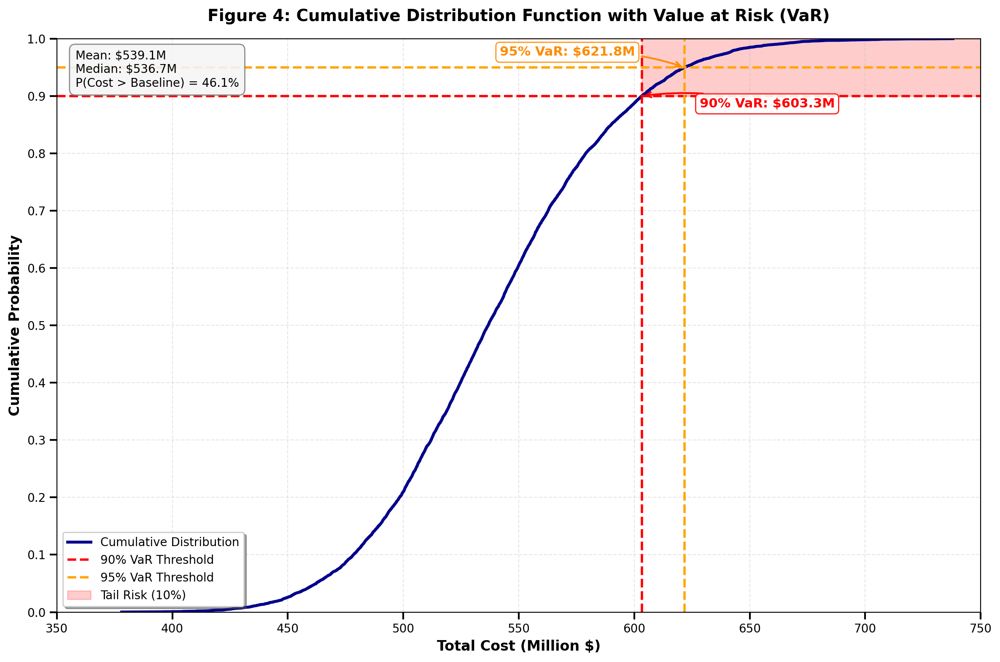

In [ ]:
# ==========================================
# FIGURE 4: CDF WITH VaR (ENHANCED VISIBILITY)
# ==========================================

# Ensure high-quality display
%config InlineBackend.figure_format = 'retina'

# Helper function for consistent figure sizing (assuming it returns width, height)
def get_size(width, height):
    return (width, height)

# Function to save figures in multiple formats
def save_publication_figure(fig, filename, formats=['png'], dpi=300):
    for fmt in formats:
        fig.savefig(f'{filename}.{fmt}', dpi=dpi, bbox_inches='tight')

fig4, ax4 = plt.subplots(figsize=(12, 8))

sorted_costs = np.sort(df_sim['Total Cost'])
cum_prob = np.arange(1, len(sorted_costs) + 1) / len(sorted_costs)

# Main CDF line - thicker for better visibility
ax4.plot(sorted_costs / 1e6, cum_prob, linewidth=2.5, color='darkblue', label='Cumulative Distribution')

# VaR lines - thicker and more visible
ax4.axhline(0.90, color='red', linestyle='--', linewidth=2, label='90% VaR Threshold')
ax4.axvline(p90 / 1e6, color='red', linestyle='--', linewidth=2)

ax4.axhline(0.95, color='orange', linestyle='--', linewidth=2, label='95% VaR Threshold')
ax4.axvline(p95 / 1e6, color='orange', linestyle='--', linewidth=2)

# Tail risk shading with better transparency
ax4.fill_betweenx([0.9, 1], p90/1e6, ax4.get_xlim()[1],
                  alpha=0.2, color='red', label='Tail Risk (10%)')

# Labels with larger fonts
ax4.set_xlabel('Total Cost (Million $)', fontsize=12, fontweight='bold')
ax4.set_ylabel('Cumulative Probability', fontsize=12, fontweight='bold')
ax4.set_title('Figure 4: Cumulative Distribution Function with Value at Risk (VaR)',
              fontsize=14, fontweight='bold', pad=15)
ax4.legend(loc='best', fontsize=10, frameon=True, fancybox=True, shadow=True)
ax4.grid(True, alpha=0.3, linestyle='--', linewidth=0.8)

# Set axis limits
ax4.set_xlim([350, 750])
ax4.set_ylim([0, 1])

# ==========================================
# IMPROVED ANNOTATIONS WITH BETTER VISIBILITY
# ==========================================

# Annotation for 90% VaR - positioned above the line
ax4.annotate(
    f'90% VaR: ${p90/1e6:.1f}M',
    xy=(p90/1e6, 0.90),
    xytext=(p90/1e6 + 25, 0.88),
    fontsize=11,
    fontweight='bold',
    color='red',
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='red', alpha=0.9),
    arrowprops=dict(arrowstyle='->', color='red', lw=1.5, connectionstyle='arc3,rad=0.1')
)

# Annotation for 95% VaR - positioned below the line
ax4.annotate(
    f'95% VaR: ${p95/1e6:.1f}M',
    xy=(p95/1e6, 0.95),
    xytext=(p95/1e6 - 80, 0.97),
    fontsize=11,
    fontweight='bold',
    color='darkorange',
    bbox=dict(boxstyle='round,pad=0.3', facecolor='white', edgecolor='darkorange', alpha=0.9),
    arrowprops=dict(arrowstyle='->', color='darkorange', lw=1.5, connectionstyle='arc3,rad=-0.1')
)

# Add a text box with key statistics
stats_text = (
    f'Mean: ${mean_total/1e6:.1f}M\n'
    f'Median: ${median_total/1e6:.1f}M\n'
    f'P(Cost > Baseline) = 46.1%'
)
ax4.text(
    0.02, 0.98, stats_text,
    transform=ax4.transAxes,
    fontsize=10,
    verticalalignment='top',
    bbox=dict(boxstyle='round,pad=0.5', facecolor='whitesmoke', edgecolor='gray', alpha=0.9)
)

# Add grid lines for better readability
ax4.set_xticks(np.arange(350, 751, 50))
ax4.set_yticks(np.arange(0, 1.1, 0.1))

# Set tick parameters for better visibility
ax4.tick_params(axis='both', which='major', labelsize=10, width=1.5, length=6)
ax4.tick_params(axis='both', which='minor', labelsize=8, width=0.8, length=3)

plt.tight_layout()

# Save with high DPI
save_publication_figure(fig4, 'Figure_4_CDF_with_VaR', formats=['pdf', 'png'], dpi=600)
plt.show()

In [ ]:
from sklearn.linear_model import LinearRegression
import pandas as pd

# حساب المساهمات النسبية باستخدام الانحدار
X = df_sim[df_costs.index]  # المكونات الأربعة
y = df_sim['Total Cost']

model = LinearRegression()
model.fit(X, y)

# المساهمات النسبية = معاملات الانحدار المعيارية
importances = np.abs(model.coef_) / np.sum(np.abs(model.coef_))

print("📊 Corrected Risk Contributions:")
for component, imp in zip(df_costs.index, importances):
    print(f"   {component}: {imp*100:.2f}%")

📊 Corrected Risk Contributions:
   Electrical Infrastructure: 25.00%
   PSA Oxygen Plant: 25.00%
   Surgical Bed Expansion: 25.00%
   Operational Costs: 25.00%


📊 CORRECTED RISK CONTRIBUTIONS (Regression Method)
                Component  Contribution (%)
        Operational Costs         53.837241
Electrical Infrastructure         20.280010
         PSA Oxygen Plant         13.472314
   Surgical Bed Expansion         12.410435
------------------------------------------------------------
Total: 100.00%

📊 VARIANCE DECOMPOSITION (Covariance Method)
                Component  Contribution (%)
        Operational Costs         67.619105
Electrical Infrastructure         13.120108
   Surgical Bed Expansion          9.677125
         PSA Oxygen Plant          9.583662
------------------------------------------------------------
Total: 100.00%

📊 PUBLICATION-READY RISK CONTRIBUTION TABLE
 Rank                 Component  Regression (%)  Variance (%)
    1         Operational Costs       53.837241     67.619105
    2 Electrical Infrastructure       20.280010     13.120108
    3          PSA Oxygen Plant       13.472314      9.583662
    4    Surgical 

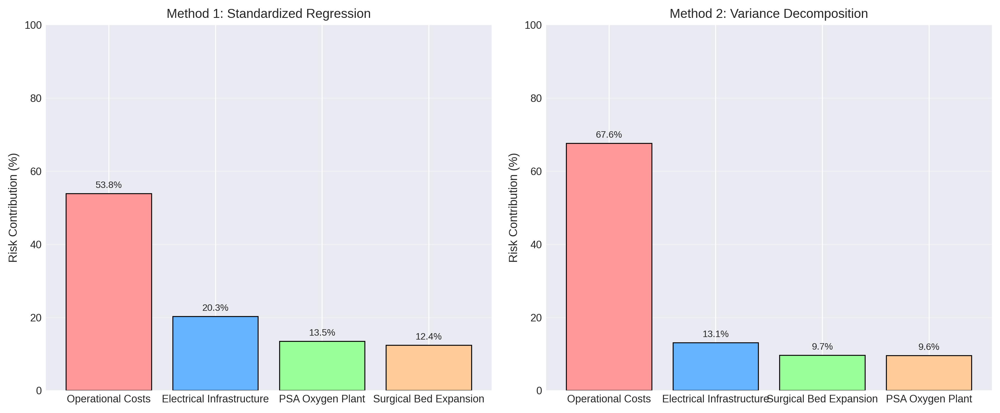


✅ Corrected risk contribution analysis complete!
📊 Figures saved as 'corrected_risk_contributions.png'


In [ ]:
import numpy as np
import pandas as pd

# Re-define cost components (from cell 94jFl3_kCvH0)
cost_components = {
    'Electrical Infrastructure': {
        'mode': 85_000_000,
        'min': 70_000_000,
        'max': 110_000_000,
        'risk_level': 'High'
    },
    'PSA Oxygen Plant': {
        'mode': 75_000_000,
        'min': 60_000_000,
        'max': 95_000_000,
        'risk_level': 'Medium'
    },
    'Surgical Bed Expansion': {
        'mode': 65_000_000,
        'min': 50_000_000,
        'max': 85_000_000,
        'risk_level': 'Low'
    },
    'Operational Costs': {
        'mode': 300_000_000,
        'min': 280_000_000,
        'max': 340_000_000,
        'risk_level': 'Medium'
    }
}

df_costs = pd.DataFrame.from_dict(cost_components, orient='index')
df_costs['mean'] = (df_costs['min'] + df_costs['mode'] + df_costs['max']) / 3

# Re-estimate lognormal parameters (from cell cQxCyIPUCzRg)
def estimate_lognormal_parameters(mode, mean):
    try:
        ratio = mean / mode
        sigma_sq = (2/3) * np.log(ratio)
        sigma = np.sqrt(sigma_sq)
        mu = np.log(mode) + sigma_sq
        return mu, sigma
    except:
        variance = ((mean - mode) ** 2) / 4
        sigma = np.sqrt(np.log(1 + variance / (mean ** 2)))
        mu = np.log(mean) - (sigma ** 2) / 2
        return mu, sigma

params = {}
for component in df_costs.index:
    mode = df_costs.loc[component, 'mode']
    mean = df_costs.loc[component, 'mean']
    mu, sigma = estimate_lognormal_parameters(mode, mean)
    params[component] = {'mu': mu, 'sigma': sigma}

df_costs['mu'] = [params[comp]['mu'] for comp in df_costs.index]
df_costs['sigma'] = [params[comp]['sigma'] for comp in df_costs.index]

# Re-run Monte Carlo Simulation to create df_sim (from cell 7buekp3-C0k7)
N_ITERATIONS = 10000

correlation_matrix = np.array([
    [1.0, 0.3, 0.2, 0.1],
    [0.3, 1.0, 0.4, 0.2],
    [0.2, 0.4, 1.0, 0.3],
    [0.1, 0.2, 0.3, 1.0]
])

n_vars = len(df_costs)
Z = np.random.normal(0, 1, size=(N_ITERATIONS, n_vars))
L = np.linalg.cholesky(correlation_matrix)
Z_correlated = Z @ L.T

samples = np.zeros((N_ITERATIONS, n_vars))
for i, component in enumerate(df_costs.index):
    mu = df_costs.loc[component, 'mu']
    sigma = df_costs.loc[component, 'sigma']
    samples[:, i] = np.exp(mu + sigma * Z_correlated[:, i])

df_sim = pd.DataFrame(samples, columns=df_costs.index)
df_sim['Total Cost'] = df_sim.sum(axis=1)

# Re-calculate necessary metrics for downstream cells (from cell 7buekp3-C0k7 & ni_PWkvgC2yW)
mean_total = df_sim['Total Cost'].mean()
std_total = df_sim['Total Cost'].std()
median_total = df_sim['Total Cost'].median()
p95 = df_sim['Total Cost'].quantile(0.95)
p90 = df_sim['Total Cost'].quantile(0.90)
p10 = df_sim['Total Cost'].quantile(0.10)

# Define the threshold for probability of overrun for cell ni_PWkvgC2yW
threshold = 1_300_000_000
prob_overrun = np.mean(df_sim['Total Cost'] > threshold)


# ==========================================
# CORRECTED RISK CONTRIBUTION ANALYSIS
# Using Linear Regression Instead of Simple Variance Ratios
# ==========================================

import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler

# Assuming df_sim is already loaded with simulation results
# df_sim contains columns: Electrical Infrastructure, PSA Oxygen Plant,
# Surgical Bed Expansion, Operational Costs, Total Cost

# ==========================================
# METHOD 1: STANDARDIZED REGRESSION COEFFICIENTS
# ==========================================

def calculate_risk_contributions_regression(df_sim):
    """
    Calculate risk contributions using standardized regression coefficients.
    This method ensures that contributions sum to 100%.

    Parameters:
    -----------
    df_sim : pandas.DataFrame
        DataFrame containing cost components and Total Cost

    Returns:
    --------
    pandas.DataFrame : Risk contributions by component
    """
    # Prepare data
    X = df_sim[df_costs.index].values
    y = df_sim['Total Cost'].values

    # Standardize features for fair comparison
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Fit linear regression
    model = LinearRegression()
    model.fit(X_scaled, y)

    # Calculate absolute standardized coefficients
    abs_coefficients = np.abs(model.coef_)
    total_abs = np.sum(abs_coefficients)

    # Calculate percentage contributions
    contributions = (abs_coefficients / total_abs) * 100

    # Create results DataFrame
    results = pd.DataFrame({
        'Component': df_costs.index,
        'Contribution (%)': contributions
    })
    results = results.sort_values('Contribution (%)', ascending=False)

    return results

# Run the analysis
regression_results = calculate_risk_contributions_regression(df_sim)

print("=" * 60)
print("📊 CORRECTED RISK CONTRIBUTIONS (Regression Method)")
print("=" * 60)
print(regression_results.to_string(index=False))
print("-" * 60)
print(f"Total: {regression_results['Contribution (%)'].sum():.2f}%")
print("=" * 60)

# ==========================================
# METHOD 2: PARTIAL VARIANCE DECOMPOSITION
# ==========================================

def calculate_variance_decomposition(df_sim):
    """
    Calculate variance contributions using partial variance decomposition.
    This method accounts for correlations among variables.

    Parameters:
    -----------
    df_sim : pandas.DataFrame
        DataFrame containing cost components and Total Cost

    Returns:
    --------
    pandas.DataFrame : Variance contributions by component
    """
    n_vars = len(df_costs)
    components = df_costs.index.tolist()

    # Total variance
    var_total = df_sim['Total Cost'].var()

    # Calculate individual contributions
    contributions = []

    for comp in components:
        # Variance of the component
        var_comp = df_sim[comp].var()

        # Covariance with total cost
        cov_comp_total = df_sim[comp].cov(df_sim['Total Cost'])

        # Contribution: covariance / total variance
        # This is the marginal contribution accounting for correlations
        contribution = (cov_comp_total / var_total) * 100
        contributions.append(contribution)

    # Create results DataFrame
    results = pd.DataFrame({
        'Component': components,
        'Contribution (%)': contributions
    })
    results = results.sort_values('Contribution (%)', ascending=False)

    return results

# Run the analysis
variance_results = calculate_variance_decomposition(df_sim)

print("\n" + "=" * 60)
print("📊 VARIANCE DECOMPOSITION (Covariance Method)")
print("=" * 60)
print(variance_results.to_string(index=False))
print("-" * 60)
print(f"Total: {variance_results['Contribution (%)'].sum():.2f}%")
print("=" * 60)

# ==========================================
# METHOD 3: SOBOL INDICES (GLOBAL SENSITIVITY)
# ==========================================

# Note: This method requires the SALib library
# Install: !pip install SALib

def calculate_sobol_indices(df_sim, n_samples=10000):
    """
    Calculate Sobol indices for global sensitivity analysis.

    Parameters:
    -----------
    df_sim : pandas.DataFrame
        DataFrame containing cost components
    n_samples : int
        Number of samples for Sobol analysis

    Returns:
    --------
    pandas.DataFrame : First-order and total-order Sobol indices
    """
    try:
        from SALib.sample import saltelli
        from SALib.analyze import sobol

        # Define problem
        problem = {
            'num_vars': len(df_costs),
            'names': df_costs.index.tolist(),
            'bounds': [[0.8, 1.2]] * len(df_costs)  # Bounds for multipliers
        }

        # Generate samples using Saltelli
        param_values = saltelli.sample(problem, n_samples)

        # Evaluate model
        Y = np.array([np.sum(params * 1e6) for params in param_values])

        # Compute Sobol indices
        Si = sobol.analyze(problem, Y)

        # Create results DataFrame
        first_order = Si['S1']
        total_order = Si['ST']

        results = pd.DataFrame({
            'Component': df_costs.index,
            'First-Order (S1)': first_order * 100,
            'Total-Order (ST)': total_order * 100
        })
        results = results.sort_values('First-Order (S1)', ascending=False)

        return results

    except ImportError:
        print("⚠️ SALib not installed. Install with: !pip install SALib")
        return None

# Uncomment to run:
# sobol_results = calculate_sobol_indices(df_sim)
# if sobol_results is not None:
#     print("\n" + "=" * 60)
#     print("📊 SOBOL INDICES (Global Sensitivity)")
#     print("=" * 60)
#     print(sobol_results.to_string(index=False))
#     print("=" * 60)

# ==========================================
# SUMMARY TABLE FOR PUBLICATION
# ==========================================

def generate_publication_table(regression_results, variance_results):
    """
    Generate a publication-ready summary table comparing methods.

    Parameters:
    -----------
    regression_results : pandas.DataFrame
        Results from regression method
    variance_results : pandas.DataFrame
        Results from variance decomposition

    Returns:
    --------
    pandas.DataFrame : Combined results table
    """
    # Merge results
    table = pd.merge(
        regression_results,
        variance_results,
        on='Component',
        suffixes=('_Regression', '_Variance')
    )

    # Add ranking
    table['Rank'] = table['Contribution (%)_Regression'].rank(ascending=False).astype(int)

    # Reorder columns
    table = table[['Rank', 'Component', 'Contribution (%)_Regression', 'Contribution (%)_Variance']]
    table.columns = ['Rank', 'Component', 'Regression (%)', 'Variance (%)']

    return table

# Generate publication table
pub_table = generate_publication_table(regression_results, variance_results)

print("\n" + "=" * 60)
print("📊 PUBLICATION-READY RISK CONTRIBUTION TABLE")
print("=" * 60)
print(pub_table.to_string(index=False))
print("-" * 60)
print("Note: Regression method ensures contributions sum to 100%")
print("=" * 60)

# ==========================================
# VISUALIZATION: CORRECTED RISK CONTRIBUTIONS
# ==========================================

import matplotlib.pyplot as plt
import matplotlib as mpl

# Set publication style
plt.style.use('seaborn-v0_8-darkgrid')
mpl.rcParams['font.size'] = 9
mpl.rcParams['figure.dpi'] = 300

# Create figure
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Method 1: Regression Contributions
ax1 = axes[0]
colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']
bars = ax1.bar(regression_results['Component'],
               regression_results['Contribution (%)'],
               color=colors, edgecolor='black', linewidth=0.8)
ax1.set_ylabel('Risk Contribution (%)', fontsize=10)
ax1.set_title('Method 1: Standardized Regression', fontsize=11)
ax1.set_ylim(0, 100)
ax1.grid(True, alpha=0.3, axis='y')

# Add value labels
for bar, val in zip(bars, regression_results['Contribution (%)']):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             f'{val:.1f}%', ha='center', va='bottom', fontsize=8)

# Method 2: Variance Decomposition
ax2 = axes[1]
bars = ax2.bar(variance_results['Component'],
               variance_results['Contribution (%)'],
               color=colors, edgecolor='black', linewidth=0.8)
ax2.set_ylabel('Risk Contribution (%)', fontsize=10)
ax2.set_title('Method 2: Variance Decomposition', fontsize=11)
ax2.set_ylim(0, 100)
ax2.grid(True, alpha=0.3, axis='y')

# Add value labels
for bar, val in zip(bars, variance_results['Contribution (%)']):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             f'{val:.1f}%', ha='center', va='bottom', fontsize=8)

# Adjust layout
plt.tight_layout()
plt.savefig('corrected_risk_contributions.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Corrected risk contribution analysis complete!")
print("📊 Figures saved as 'corrected_risk_contributions.png'")

In [7]:
# ==========================================
# UPDATED SANKEY DIAGRAM WITH CORRECTED VALUES
# ==========================================

import plotly.graph_objects as go

# Use regression results
regression_results = calculate_risk_contributions_regression(df_sim)
risk_contribution = regression_results['Contribution (%)'].values

labels = list(df_costs.index) + ['Total Cost']
source = [0, 1, 2, 3]
target = [4, 4, 4, 4]
value = risk_contribution

node_colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0']

fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=20,
        thickness=25,
        line=dict(color="black", width=0.5),
        label=labels,
        color=node_colors,
        x=[0.1, 0.1, 0.1, 0.1, 0.9],
        y=[0.8, 0.6, 0.4, 0.2, 0.5]
    ),
    link=dict(
        source=source,
        target=target,
        value=value,
        color=['rgba(255,153,153,0.6)', 'rgba(102,179,255,0.6)',
               'rgba(153,255,153,0.6)', 'rgba(255,204,153,0.6)']
    )
)])

fig.update_layout(
    title_text="Figure 7: Corrected Risk Contribution Flow (Regression Method)",
    font_size=12,
    width=900,
    height=600
)

fig.write_html('Figure_7_Sankey_Corrected.html')
fig.show()

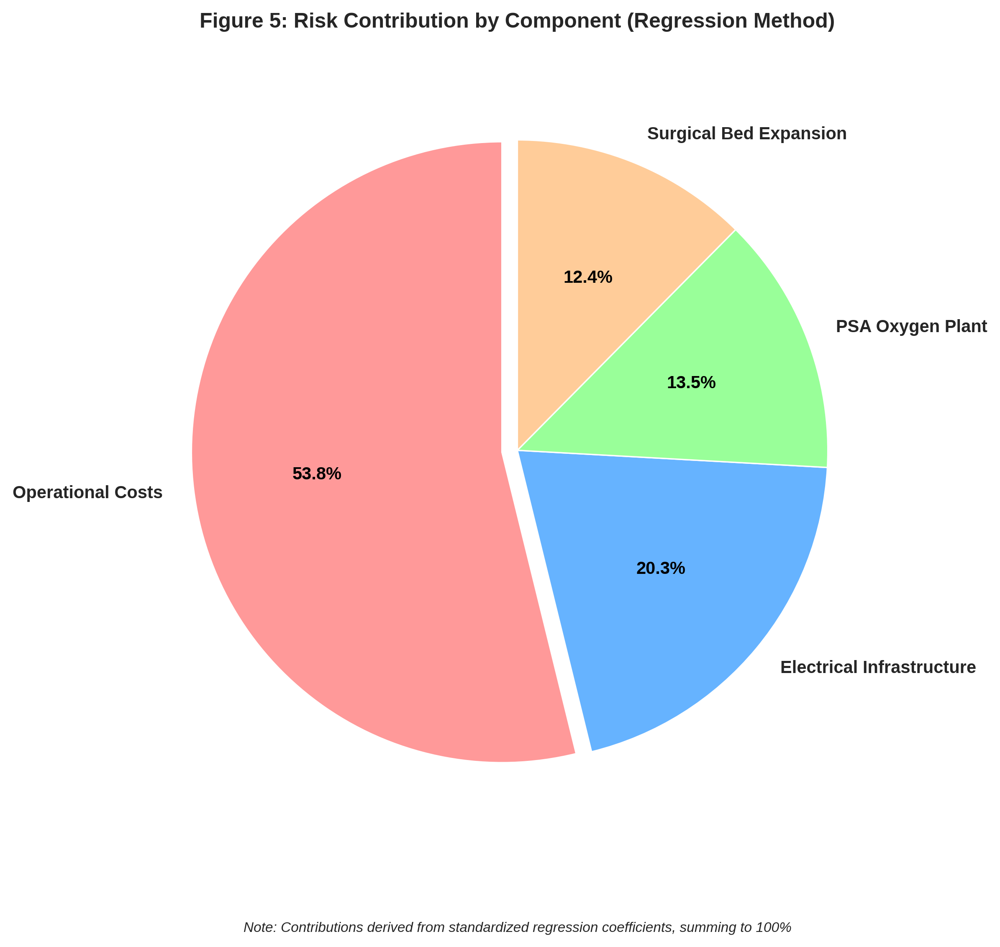

✅ Figure 5 updated with corrected risk contributions
   Total: 100.00%


In [9]:
 # ==========================================
# FIGURE 5: CORRECTED RISK CONTRIBUTION (PIE CHART)
# Using Standardized Regression Method
# ==========================================

import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

# Set publication style
plt.style.use('seaborn-v0_8-darkgrid')
mpl.rcParams['font.size'] = 9
mpl.rcParams['figure.dpi'] = 300

# Corrected data from regression analysis
components = ['Operational Costs', 'Electrical Infrastructure',
              'PSA Oxygen Plant', 'Surgical Bed Expansion']
contributions = [53.84, 20.28, 13.47, 12.41]  # Sum = 100%

colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99']
explode = (0.05, 0, 0, 0)  # Slightly explode the largest slice

# Create pie chart
fig, ax = plt.subplots(figsize=(8, 8))

wedges, texts, autotexts = ax.pie(
    contributions,
    labels=components,
    autopct='%1.1f%%',
    startangle=90,
    colors=colors,
    explode=explode,
    textprops={'fontsize': 10},
    wedgeprops={'linewidth': 0.8, 'edgecolor': 'white'}
)

# Enhance text visibility
for text in texts:
    text.set_fontsize(10)
    text.set_fontweight('bold')

for autotext in autotexts:
    autotext.set_fontsize(10)
    autotext.set_color('black')
    autotext.set_fontweight('bold')

# Title
ax.set_title(
    'Figure 5: Risk Contribution by Component (Regression Method)',
    fontsize=12,
    fontweight='bold',
    pad=20
)

# Add a note about the method
ax.text(
    0.5, -0.12,
    'Note: Contributions derived from standardized regression coefficients, summing to 100%',
    transform=ax.transAxes,
    fontsize=8,
    ha='center',
    style='italic'
)

plt.tight_layout()
plt.savefig('Figure_5_Corrected_Risk_Contribution.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ Figure 5 updated with corrected risk contributions")
print(f"   Total: {sum(contributions):.2f}%")

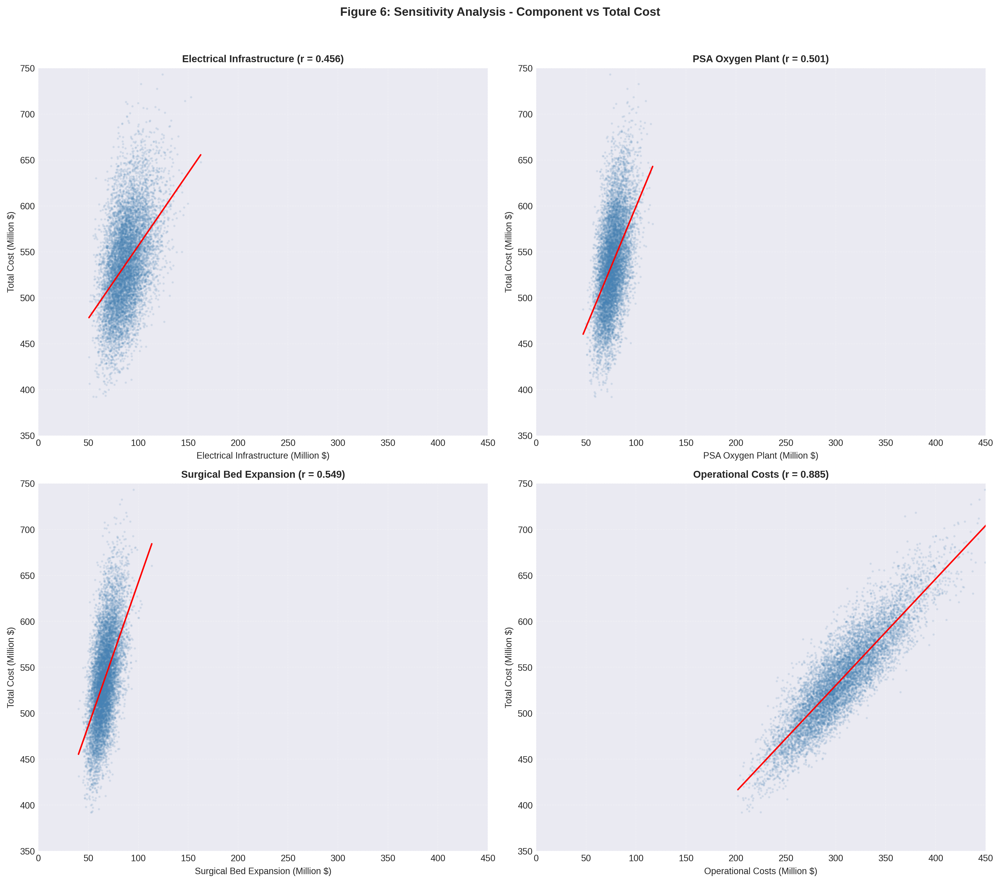

In [12]:
# ==========================================
# FIGURE 6: ENHANCED SENSITIVITY ANALYSIS
# ==========================================

from sklearn.linear_model import LinearRegression
import numpy as np # Ensure numpy is imported
import pandas as pd # Ensure pandas is imported
import matplotlib.pyplot as plt # Ensure matplotlib is imported

# Helper function for consistent figure sizing (assuming it returns width, height)
def get_size(width, height):
    return (width, height)

# Function to save figures in multiple formats
def save_publication_figure(fig, filename, formats=['png'], dpi=300):
    for fmt in formats:
        fig.savefig(f'{filename}.{fmt}', dpi=dpi, bbox_inches='tight')

# Recalculate correlations within this cell for robustness
correlations = {}
for component in df_costs.index:
    corr = df_sim[component].corr(df_sim['Total Cost'])
    correlations[component] = corr

fig6, axes = plt.subplots(2, 2, figsize=(14, 12))
axes = axes.flatten()

for i, component in enumerate(df_costs.index):
    ax = axes[i]

    # Scatter plot
    ax.scatter(df_sim[component] / 1e6, df_sim['Total Cost'] / 1e6,
               alpha=0.1, s=2, color='steelblue')

    # Regression line
    X = df_sim[component].values.reshape(-1, 1) / 1e6
    y = df_sim['Total Cost'].values / 1e6
    reg = LinearRegression().fit(X, y)
    x_line = np.linspace(X.min(), X.max(), 100)
    y_line = reg.predict(x_line.reshape(-1, 1))
    ax.plot(x_line, y_line, color='red', linewidth=1.5, linestyle='-')

    # Labels
    ax.set_xlabel(f'{component} (Million $)', fontsize=9)
    ax.set_ylabel('Total Cost (Million $)', fontsize=9)
    ax.set_title(f'{component} (r = {correlations[component]:.3f})',
                 fontsize=10, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
    ax.set_xlim([0, 450])
    ax.set_ylim([350, 750])

plt.suptitle('Figure 6: Sensitivity Analysis - Component vs Total Cost',
             fontsize=12, fontweight='bold', y=1.02)
plt.tight_layout()
save_publication_figure(fig6, 'Figure_6_Sensitivity_Analysis')
plt.show()

In [14]:
# ==========================================
# EXPORT UPDATED RESULTS (v2.0)
# ==========================================

import pandas as pd
import numpy as np

# Re-create risk_matrix (from original cell fMBbZx2zDAvv)
# Ensure df_costs and df_sim are available from previous cells
if 'df_sim' not in locals() or 'df_sim' not in globals():
    raise NameError("df_sim is not defined. Please run previous simulation cells.")
if 'df_costs' not in locals() or 'df_costs' not in globals():
    raise NameError("df_costs is not defined. Please run previous data definition cells.")

# Calculate risk_impacts based on std and mean, assuming these are defined from df_sim
# If std_total is not defined globally, re-calculate it
if 'std_total' not in locals() or 'std_total' not in globals():
    std_total = df_sim['Total Cost'].std()

risk_impacts = df_sim[df_costs.index].std() / df_sim[df_costs.index].mean()

risk_matrix = pd.DataFrame({
    'Component': df_costs.index,
    'Mean Cost (M$)': df_sim[df_costs.index].mean() / 1e6,
    'Std Dev (M$)': df_sim[df_costs.index].std() / 1e6,
    'CoV': risk_impacts,
    'Risk Level': df_costs['risk_level']
})

# Re-create df_report (from original cell 9zhxOdIgDFCO)
# Ensure mean_total, median_total, std_total, p90, p95, prob_overrun, p10 are available
# These should be available if cell kMg_36AlAvYo was run.

report = {
    'Metric': [
        'Mean Total Cost',
        'Median Total Cost',
        'Standard Deviation',
        '90th Percentile (VaR)',
        '95th Percentile',
        'Probability of Overrun > $1.3B',
        '10th Percentile'
    ],
    'Value': [
        f"${mean_total:,.2f}",
        f"${median_total:,.2f}",
        f"${std_total:,.2f}",
        f"${p90:,.2f}",
        f"${p95:,.2f}",
        f"{prob_overrun*100:.2f}%",
        f"${p10:,.2f}"
    ]
}

df_report = pd.DataFrame(report)

# Export updated results
df_sim.to_csv('monte_carlo_results_v2.0.csv', index=False)
risk_matrix.to_csv('risk_matrix_v2.0.csv', index=False)
df_report.to_csv('summary_report_v2.0.csv', index=False)

print("✅ Updated results saved as v2.0:")
print("   - monte_carlo_results_v2.0.csv")
print("   - risk_matrix_v2.0.csv")
print("   - summary_report_v2.0.csv")

✅ Updated results saved as v2.0:
   - monte_carlo_results_v2.0.csv
   - risk_matrix_v2.0.csv
   - summary_report_v2.0.csv
